# Credit Card Users Churn Prediction

| Project Submission| Date |
| --- | --- |
| Rob Barker | August 17, 2024 |
| Course | Advanced ML |

### Development Environment
* Local development with Visual Studio Code.
* Jupyter Notebook and Python 3.11.7 with Anaconda3. 
* Google Colab/Drive not used.
* Generated HTML using the jupyter cli

   ```jupyter nbconvert --to html PYF_Project_LearnerNotebook_FullCode.ipynb```
* Added --- (markdown) lines for easier readability for myself. 

### Formatting Notes
* Moved helper functions into separate section.
* Added line separators for readability.
---
---

# Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


---
---
# Setup Environment

## Importing necessary libraries

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
#%pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used

# Visual Studio Code implementation using %pip.
#%pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user

# Correction of the imbalanced-learn library to imblearn.
%pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.12.0 xgboost==2.0.3 -q --user
%pip install --upgrade -q threadpoolctl
%pip install tabulate

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [78]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To display plots inside the Jupyter Notebook
%matplotlib inline

#sns.set()

# To tune model, get different metric scores, and split data
import sklearn.metrics as metrics
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
    classification_report,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)

# To help with model building.
from sklearn.svm import SVC

# To help with model building.
from xgboost import XGBClassifier

# Set pandas to display floating-point values with three decimal places for better readability. 
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Nicely display all the columns of the dataframe in the notebook. 
from tabulate import tabulate

# To suppress warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)


## Helper Functions

**INFORMATION:** --- Execute all helper function cells before starting analysis.

### Function to plot a boxplot and a histogram along the same scale

In [6]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Function to create labeled barplots

In [7]:
def labeled_barplot(data, feature, perc=False, n=None, rotation=90, fontsize=15):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=rotation, fontsize=fontsize)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

 ### Function to plot stacked bar chart
 **Note:** Updated function stacked_barplot to add percentages to the bar graphs.

In [8]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart with percentages.

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    
    # Crosstab with counts.
    tab_counts = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab_counts)
    print("-" * 120)
    
    # Crosstab with percentages.
    tab_percentage = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    ) * 100
    
    # Combine counts and percentages.
    tab_combined = tab_counts.copy()
    for col in tab_percentage.columns:
        tab_combined[col + " (%)"] = tab_percentage[col]
    
    print(tab_combined)
    print("-" * 120)
    
    # Plot stacked bar chart.
    ax = tab_percentage.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    
    # Add percentage labels to the bars.
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy() 
        ax.annotate(f"{height:.1f}%", (x + width / 2, y + height / 2), ha="center", va="center")
    
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

### Function to plot distributions


In [9]:
def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

### Function to compute different metrics to check performance of a classification model built using sklearn

In [11]:
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

## Loading the dataset

In [21]:
# Load dataset.
cc_churn_df_org = pd.read_csv("/Users/robbarker/Desktop/Credit-Card-Users-Churn-Prediction/BankChurners.csv")
cc_churn_df = cc_churn_df_org.copy()

---
---
# Data Overview

- Observations
- Sanity checks

In [22]:
# Check the first few rows of the original dataset.
cc_churn_df_org.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [23]:
# Retrieve first few rows of the copied dataset.
cc_churn_df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [24]:
# Retrieve last few rows of the copied dataset.
cc_churn_df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


In [25]:
# Retrieve number of rows and columns using the shape attribute of the DataFrame.
rows, columns = cc_churn_df.shape

# Print the number of rows and columns from the dataset. Output is formatted into thousands. 
# There are only 9 columns but for consistency, the output includes (,) format.
print(f'Number of Rows: {rows:,}')
print(f'Number of Columns: {columns:,}')

Number of Rows: 10,127
Number of Columns: 21


**Observations**
* There are 10,127 rows and 21 columns in the dataset.

In [26]:
# Get dataset information.
cc_churn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

**Observations**
* There following datatypes are observed.
  * There are 5 float64
  * There are 10 int64
  * There are 6 object
* There are null values in Eduation_Level and Marital_Status.

In [27]:
# Check for missing values in the dataset.
missing_values = cc_churn_df.isnull().sum()

# Output if there are any missing data points in the dataset.
if missing_values.sum() > 0:
    print("There are missing data points in the dataset.")
    
    # List columns with missing values
    missing_columns = missing_values[missing_values > 0]

    print("Columns with missing values:")
    print(missing_columns)
else:
    print("There are no missing data points in the dataset.")


There are missing data points in the dataset.
Columns with missing values:
Education_Level    1519
Marital_Status      749
dtype: int64


**Observations**
* Education_Level has 1,519 missing values.
* Marital_Status has 749 missing values.

In [28]:
# Check for duplicate values.
cc_churn_df.duplicated().sum()

0

**Observation**
* There are no duplicates.

In [29]:
# Statistical summary of the dataset.
cc_churn_df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


**Observation**

| Column Name | Observation |
| --- | --- |
| CLIENTNUM | Unique client identifier. Can be dropped from data set. Will be done during data pre-processing. |
| Customer_Age | Customers range between 26 - 73 years old with an average of 46. |
| Dependent_count | Customer's dependent range from having none up to 5. |
| Months_on_book | Customers range been 1.1 and almost 5 years of being a client. Most customers have been with the bank for 3 years. |
| Total_Relationship_Count | All customers have at least 1 product. On average customers have 4 products. |
| Months_Inactive_12_mon | On average customers have had no interaction with Thera Bank for 2 months. This could be an indicator of why there is credit churn in the bank. |
| Contacts_Count_12_mon | This is another potential indicator of credit card churn because there are customers that have had no contact with the bank of the last 12 months. The maximum contacts is 6. For a successful bank one would think contacting customers will lead to new opportunties. |
| Credit_Limit | There is a wide range of credit limits from a minimum of $ 1,438 - $3 4,516. The average customer has a credit limit of $ 8,632. |
| Total_Revolving_Bal | Balances that 75% of customers only retain a balance of $ 1,784. The maximum balance maintained is $ 2,517. There is a wide spread of data from $0 - $2,517 which could indicate outliers.|
| Avg_Open_To_Buy | The average available credit for customers is $ 7,469 with a maximum of open to spend of $34,516. This is a very wide spread from $ 3 to $ 34,516. There could be outliers in this data point.|
| Total_Trans_Amt | There is a wide spread of spending between $ 510 up to $ 18,484. This could contain outliers. |
| Total_Trans_Ct | At minimum 10 transactions were made with a maximum of 139. On average customers make 65 transactions. |
| Avg_Utilization_Ratio | Customers on average use their credit 28% of the time and some customers using their cards 100% of the time. |

In [12]:
# Get summary of the categorical columns.
cc_churn_df.describe(include=["object"]).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


**Observations**

EDIT

In [14]:
# Loop through the categorical columns and print unique values.
for n in cc_churn_df.describe(include=["object"]).columns:
    print(f"Unique values in {n} are :")
    
    # Create list of lists for the table.
    table = [[value, count] for value, count in cc_churn_df[n].value_counts().items()]
    
    # Print table using tabulate.
    print(tabulate(table, headers=["Value", "Count"], tablefmt="grid"))
    print("\n")

Unique values in Attrition_Flag are :
+-------------------+---------+
| Value             |   Count |
+===================+=========+
| Existing Customer |    8500 |
+-------------------+---------+
| Attrited Customer |    1627 |
+-------------------+---------+


Unique values in Gender are :
+---------+---------+
| Value   |   Count |
+=========+=========+
| F       |    5358 |
+---------+---------+
| M       |    4769 |
+---------+---------+


Unique values in Education_Level are :
+---------------+---------+
| Value         |   Count |
+===============+=========+
| Graduate      |    3128 |
+---------------+---------+
| High School   |    2013 |
+---------------+---------+
| Uneducated    |    1487 |
+---------------+---------+
| College       |    1013 |
+---------------+---------+
| Post-Graduate |     516 |
+---------------+---------+
| Doctorate     |     451 |
+---------------+---------+


Unique values in Marital_Status are :
+----------+---------+
| Value    |   Count |
+====

EDIT

**Observations:**
* Most of the records are for existing customers.
* Most of the bank's customers are female
* Most customers are graduates.
* Most customers are married.
* Most customers lie in the income group of less than $40k
* Most customers have a blue card.
* The data is imbalanced

**Missing values:**
* 'abc' value of Income_Category can be considered and treated as missing values.

---
---
# Exploratory Data Analysis (EDA)

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?

---

## Univariant Analysis

### Numerical Data Types

In [31]:
# Get columns of int64 and Float64 types.
numeric_columns = cc_churn_df.select_dtypes(include=["int64", "Float64"]).columns

# Create a list of lists with column names and their data types.
numerical_columns_table = [[col, cc_churn_df[col].dtype] for col in numeric_columns]

print(tabulate(numerical_columns_table, headers=["Column Names", "Data Type"], tablefmt="grid"))

+--------------------------+-------------+
| Column Names             | Data Type   |
+==========================+=============+
| CLIENTNUM                | int64       |
+--------------------------+-------------+
| Customer_Age             | int64       |
+--------------------------+-------------+
| Dependent_count          | int64       |
+--------------------------+-------------+
| Months_on_book           | int64       |
+--------------------------+-------------+
| Total_Relationship_Count | int64       |
+--------------------------+-------------+
| Months_Inactive_12_mon   | int64       |
+--------------------------+-------------+
| Contacts_Count_12_mon    | int64       |
+--------------------------+-------------+
| Credit_Limit             | float64     |
+--------------------------+-------------+
| Total_Revolving_Bal      | int64       |
+--------------------------+-------------+
| Avg_Open_To_Buy          | float64     |
+--------------------------+-------------+
| Total_Amt

#### Customer_Age

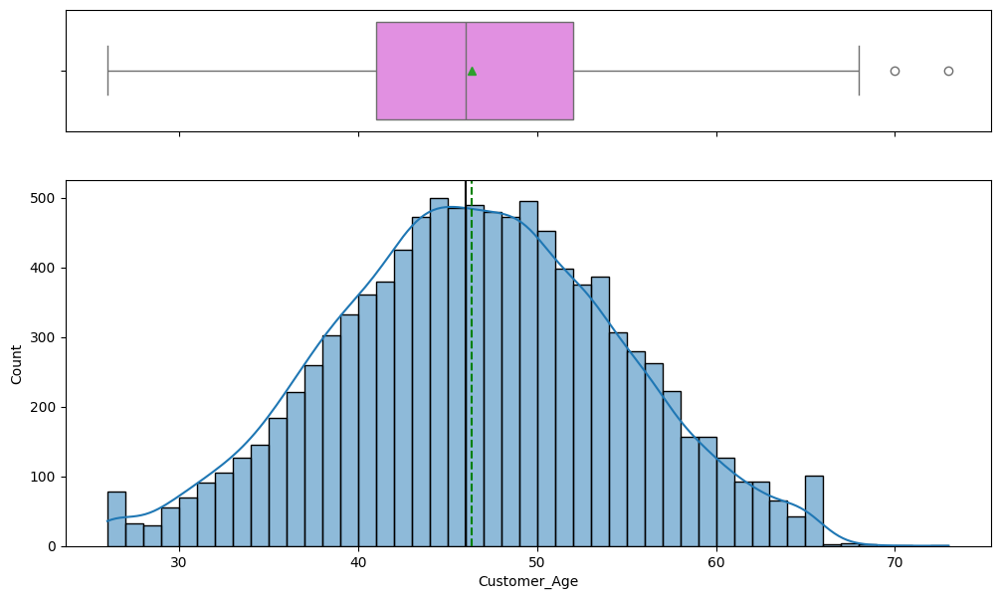

In [488]:
histogram_boxplot(cc_churn_df, "Customer_Age", kde=True)

**Observations**
* Customer_Age shows a normal distribution with a mean around 46 years.
* The distribution of the customer age is slightly skewed to the right and is slightly peaked.
* There are a few outliers in the data around 70 years of age.

#### Dependent_count

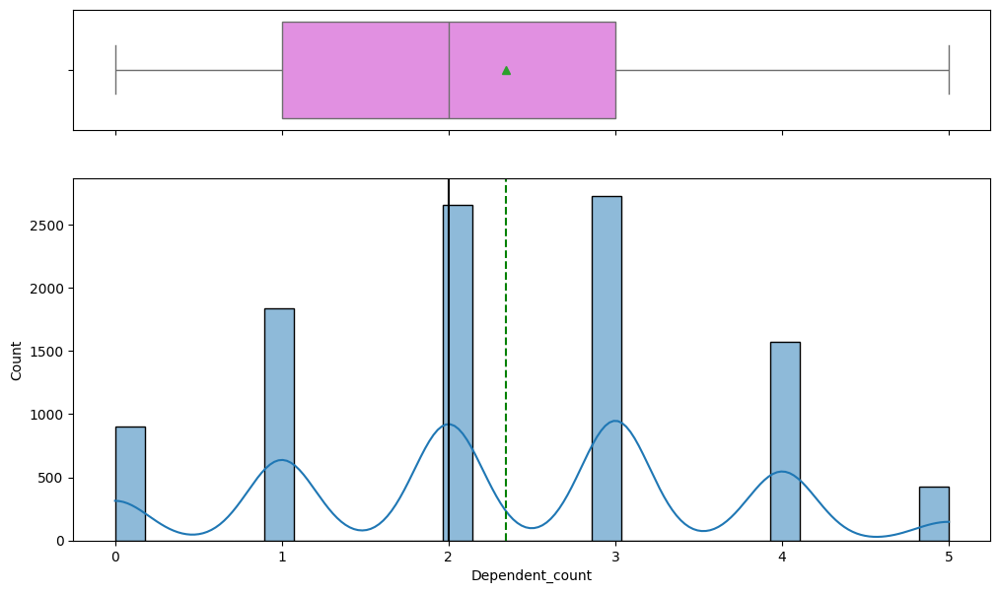

In [487]:
histogram_boxplot(cc_churn_df, "Dependent_count", kde=True)

**Observations**
* Dependent_count does not show any outliers.
* The average is ~2.3 dependents.
* Majority of customers have 2 or 3 dependents. ng method for Decision tree with undersampled data

#### Months_on_book

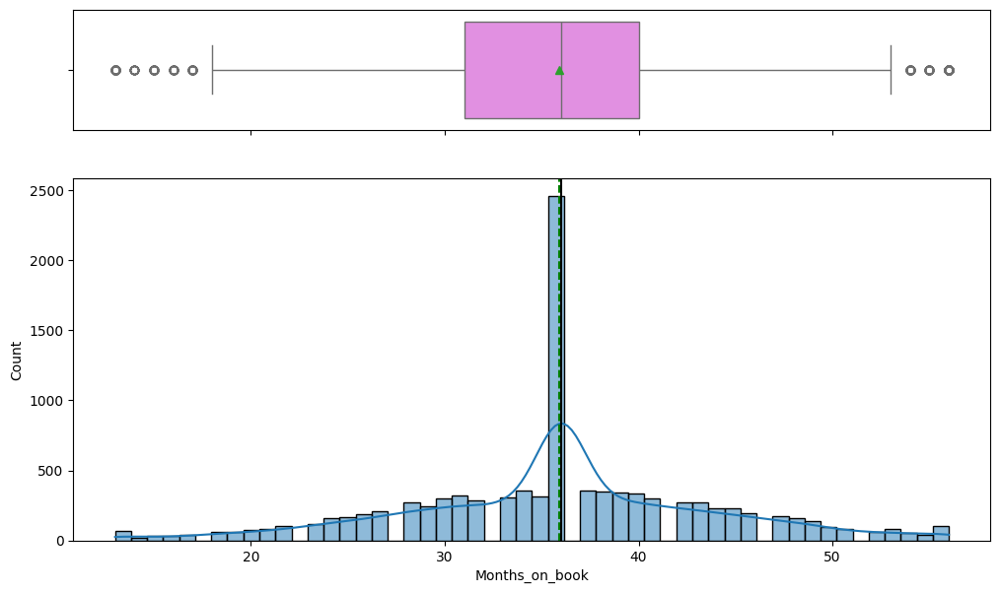

In [486]:
histogram_boxplot(cc_churn_df, "Months_on_book", kde=True)

**Observations**
* Months_on_book shows a high percentage of customers being with the bank for 36 months (3 years).
* There are outliers on both ends of the distribution.

#### Total_Relationship_Count

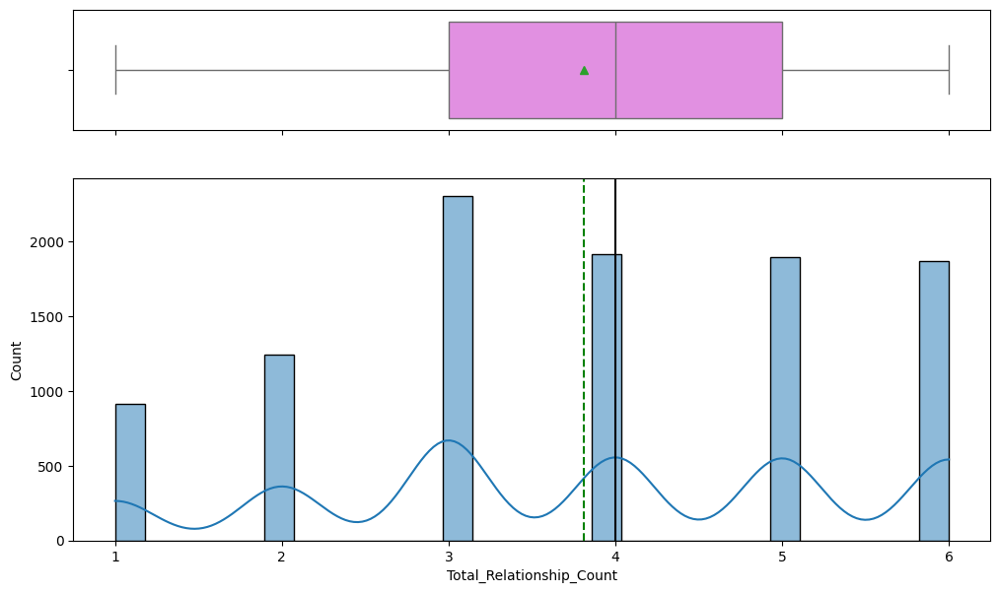

In [484]:
histogram_boxplot(cc_churn_df, "Total_Relationship_Count", kde=True)

**Observations**
* No outliers.
* Most customers have 3 products.
* There is a large number of customers having 4, 5, and 6 products. 

#### Months_Inactive_12_mon

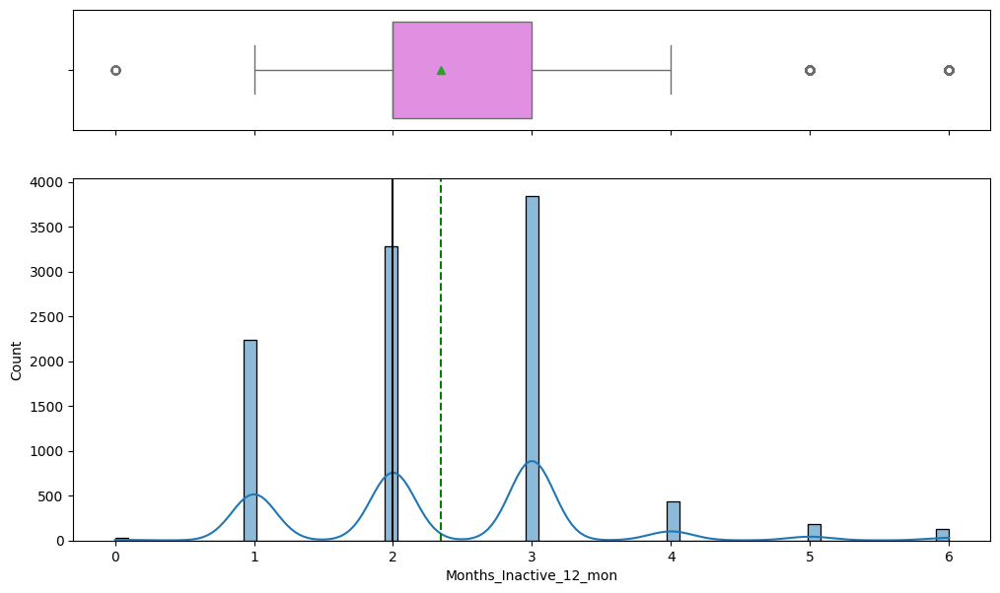

In [483]:
histogram_boxplot(cc_churn_df, "Months_Inactive_12_mon", kde=True)

**Observations**
* There are outliers on both ends of the distribution.
* The distribution is skewed to the right.
* Most customers have a low number of contacts around the 2 month to 3 month range.

#### Contacts_Count_12_mon

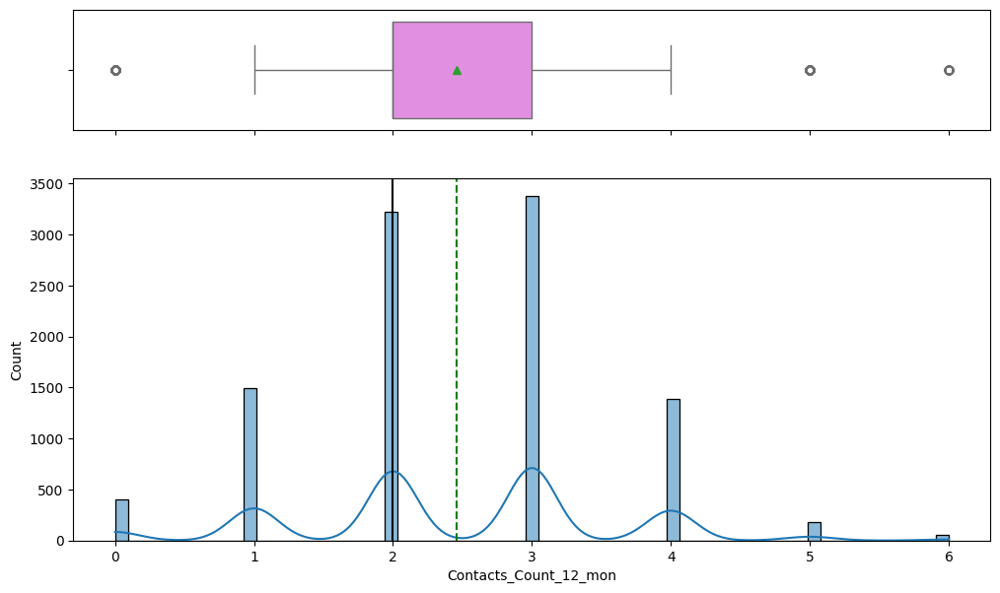

In [482]:
histogram_boxplot(cc_churn_df, "Contacts_Count_12_mon", kde=True)

**Observations**
* There are outliers on both sides of the distribution. 
* There are a small amount customers who have never contacted Thera bank and some that have engaged more than 6 times in the last 12 months.
* Most customers engaged with Thera bank between 2 and 3 times over the last 12 months.

#### Credit_Limit

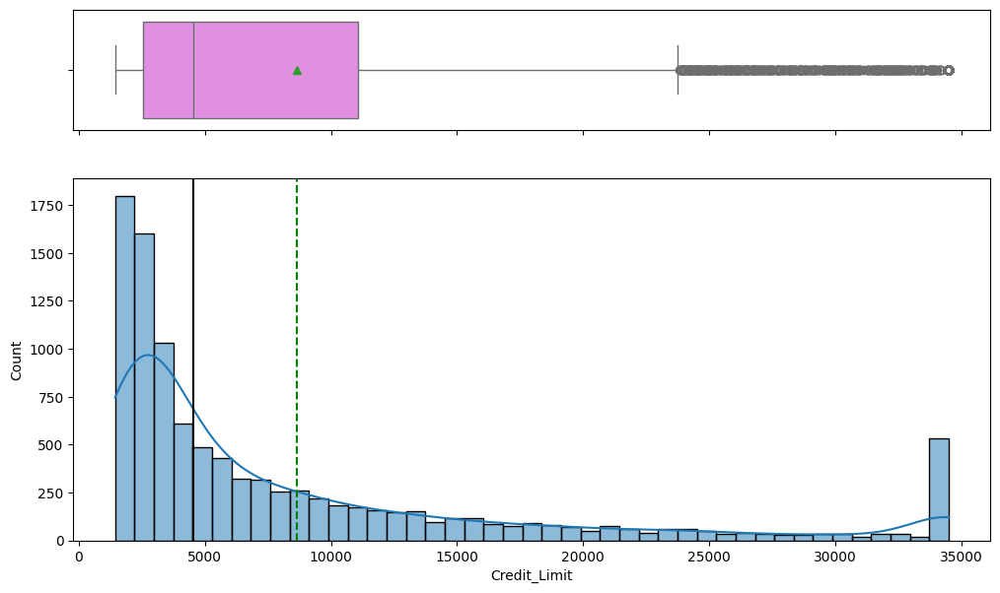

In [481]:
histogram_boxplot(cc_churn_df, "Credit_Limit", kde=True)

**Observations**
* Credit_Limit is largely right skewed distribution.
* There are ~600 customers with a credit limit of $35,000.
* The median shows customers have a credit limit of ~$4,500.

#### Total_Revolving_Bal

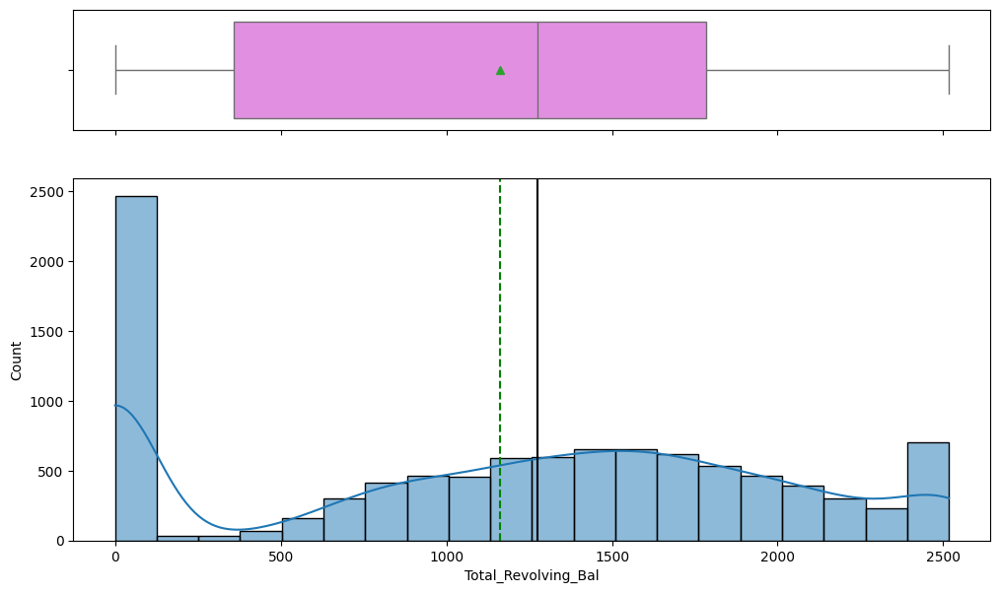

In [480]:
histogram_boxplot(cc_churn_df, "Total_Revolving_Bal", kde=True)

**Observations**
* A high percentage of customers do not carry a balance.
* No outliers.

#### Avg_Open_To_Buy

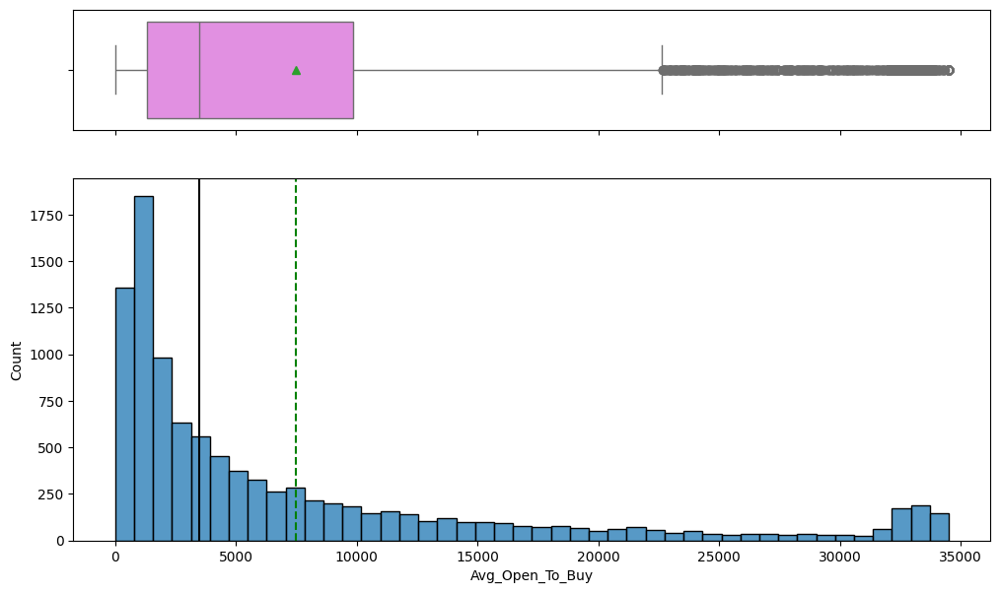

In [315]:
histogram_boxplot(cc_churn_df, "Avg_Open_To_Buy")

**Observations**
* Distribution heavily right skewed.
* There are many outliers with customers who have high credit limits. This indicates customers who have lower credit limits tend to spend against their full credit limit.

#### Total_Amt_Chng_Q4_Q1

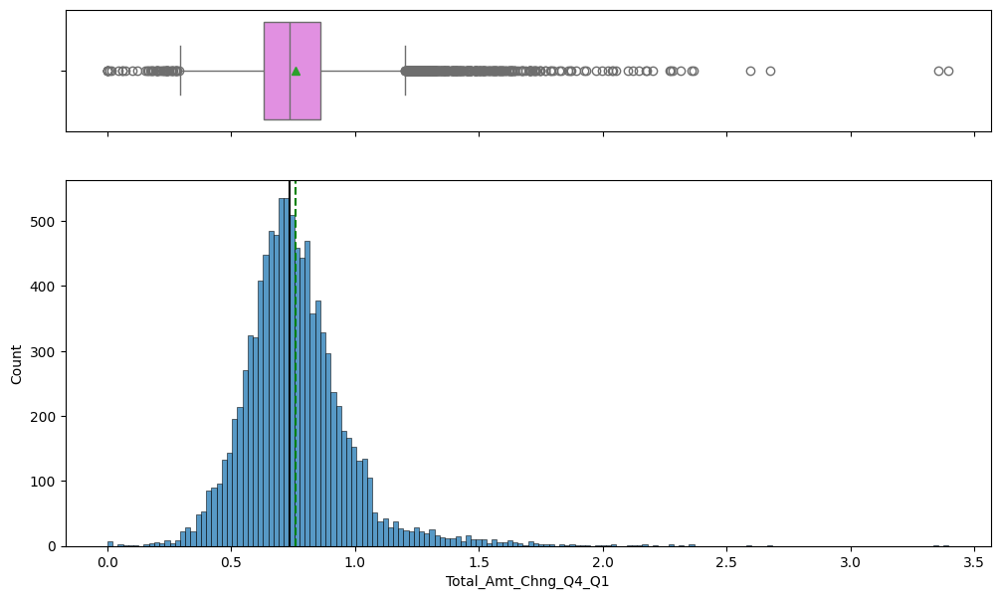

In [316]:
histogram_boxplot(cc_churn_df, "Total_Amt_Chng_Q4_Q1")

**Observations**
* A slightly right skewed distribution.
* Many outliers on both sides of the boxplot.
* The graph suggests there are smaller spending changes from Q4 to Q1 for most customers.

#### Total_Trans_Amt

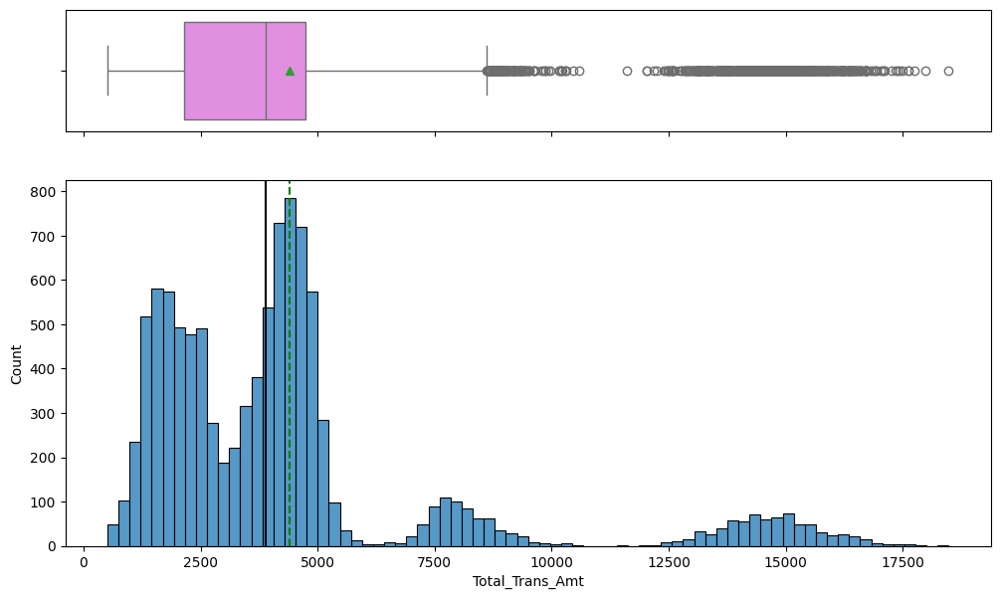

In [317]:
histogram_boxplot(cc_churn_df, "Total_Trans_Amt")

**Observations**
* There are multiple peaks within the distribution. This suggests a difference with groups of customers and how they spend using credit.
* This distribution is mulitmodal.

#### Total_Trans_Ct

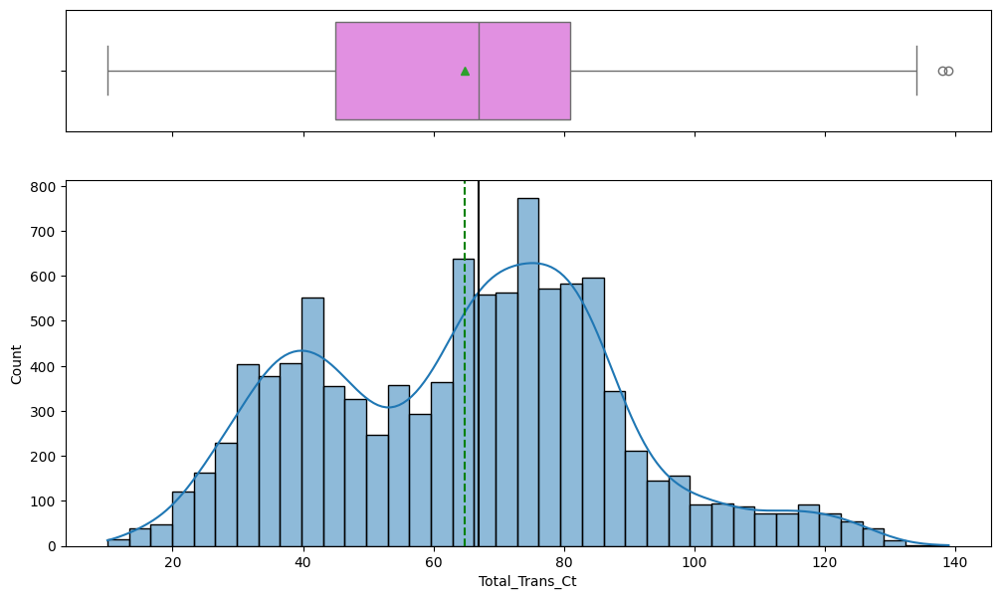

In [490]:
histogram_boxplot(cc_churn_df, "Total_Trans_Ct", kde=True)

**Observations**
* There are minimal outliers.
* Distribution is not completely normalized and shows two different peaks representing different modes.
* Comparing Total_Trans_Amt vs Total_Trans_Ct shows that there are a small number of transactions that have higher amounts.

#### Total_Ct_Chng_Q4_Q1

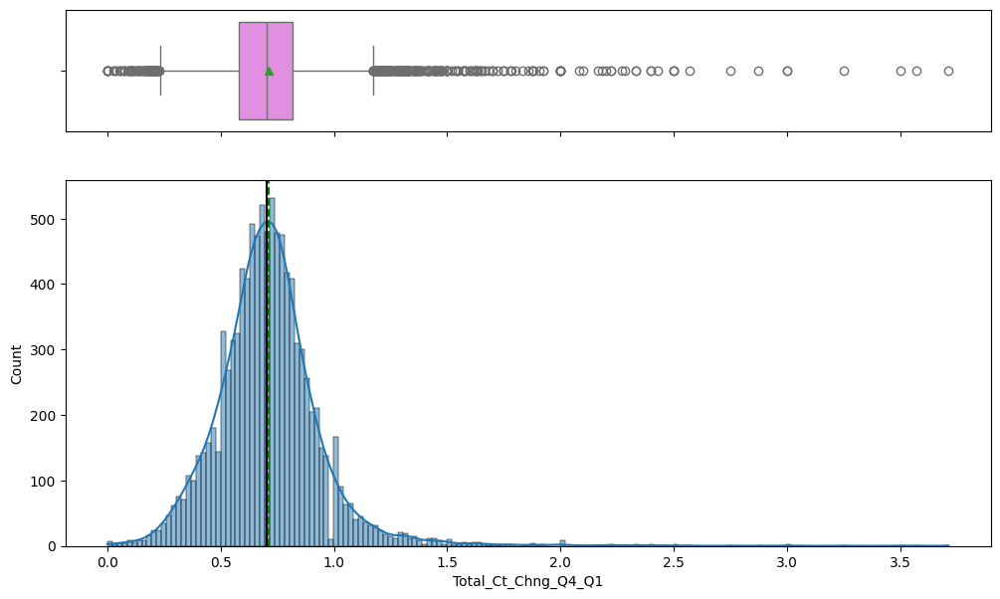

In [491]:
histogram_boxplot(cc_churn_df, "Total_Ct_Chng_Q4_Q1", kde=True)

**Observations**
* Total_Amt_Chng_Q4_Q1 vs Total_Ct_Chng_Q4_Q1 are very similiar with a right skewed distribution.
* There are many outliers on both sides of the boxplot.
* The graph suggests the spending patterns for number of transactions aligns with the amount of transactions.

#### Avg_Utilization_Ratio

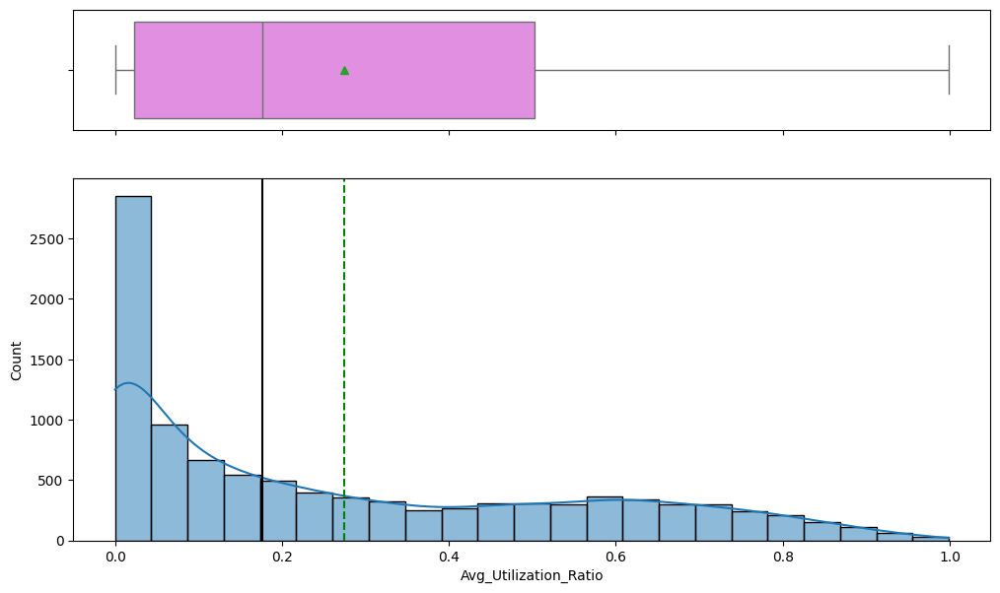

In [492]:
histogram_boxplot(cc_churn_df, "Avg_Utilization_Ratio", kde=True)

**Observations**
* A large percentage of customers do not use the full amount of their credit line.
* Right skewed distribution. 

### Categorical Data Types

In [422]:
# Get columns of int64 and Float64 types.
cat_columns = cc_churn_df.select_dtypes(include=["object"]).columns

# Create a list of lists with column names and their data types.
cat_columns_table = [[col, cc_churn_df[col].dtype] for col in cat_columns]

print(tabulate(cat_columns_table, headers=["Column Names", "Data Type"], tablefmt="grid"))

+-----------------+-------------+
| Column Names    | Data Type   |
+=================+=============+
| Attrition_Flag  | object      |
+-----------------+-------------+
| Gender          | object      |
+-----------------+-------------+
| Education_Level | object      |
+-----------------+-------------+
| Marital_Status  | object      |
+-----------------+-------------+
| Income_Category | object      |
+-----------------+-------------+
| Card_Category   | object      |
+-----------------+-------------+


#### Attrition_Flag

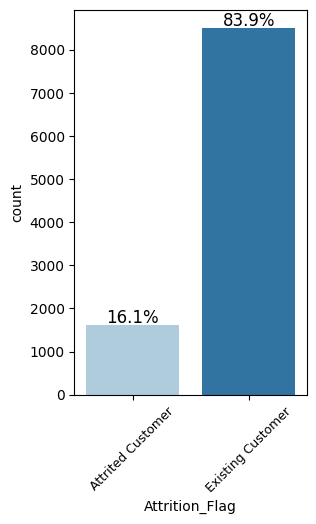

In [419]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Attrition_Flag"].nunique()

labeled_barplot(cc_churn_df, "Attrition_Flag", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* The data shows a large imbalance of 68% between existing and attrited customers.
* The imbalance indicates there could be a bias towards existing customers.

#### Gender

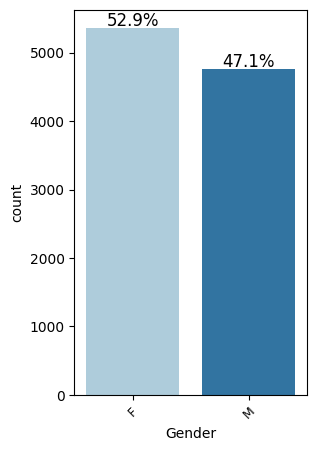

In [420]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Gender"].nunique()

labeled_barplot(cc_churn_df, "Gender", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* 53% of customers are Female.
* 47% of customers are Male.

#### Education_Level

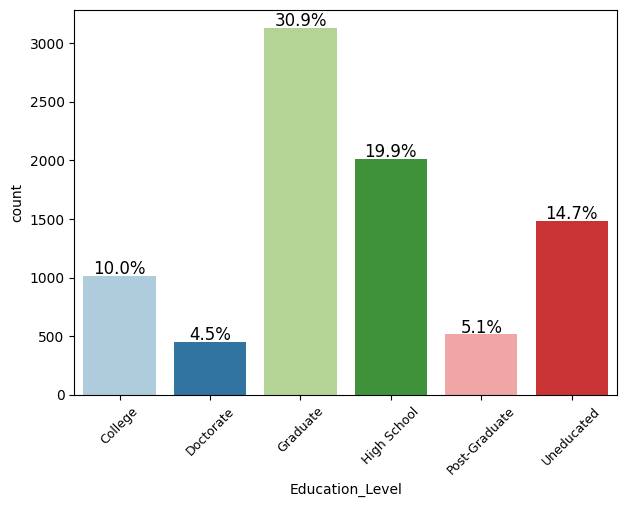

In [421]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Education_Level"].nunique()

labeled_barplot(cc_churn_df, "Education_Level", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* Thera bank has 31% of customers with a graduate degree followed by those with high school education.
* 15% in the uneducated bucket could mean no data was captured. This is a fair percentage of customers that should be investigated further.

#### Marital_Status

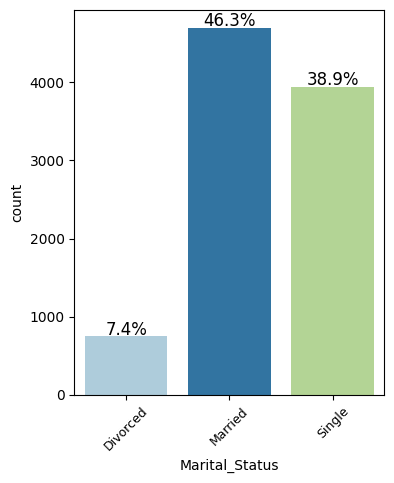

In [390]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Marital_Status"].nunique()

labeled_barplot(cc_churn_df, "Marital_Status", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* The data collected for Marital_Status shows a representation of 93%.
* There is 7% of data that is unknown for marital status.
* Majority of customers are married (46%) and single (39%).

#### Income_Category

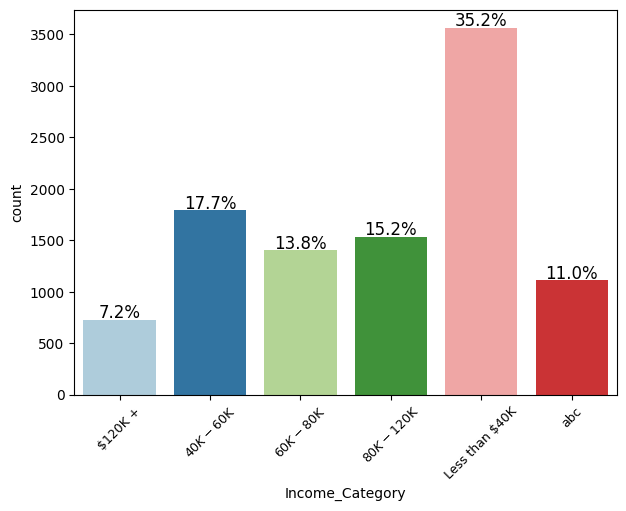

In [493]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Income_Category"].nunique()

labeled_barplot(cc_churn_df, "Income_Category", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* 35% of customers make $40,000 or less followed by those that make $40,000 to $60,000.
* "abc" column needs to be treated as missing values. 11% of the customer base is large enough to influence other income categories.

#### Card_Category

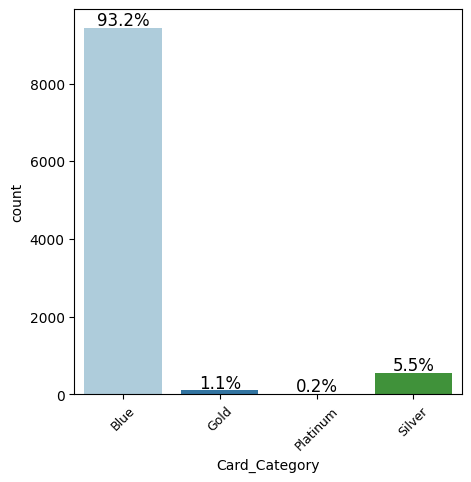

In [392]:
# Get the number of unique options in the categorical column
num_unique_options = cc_churn_df["Card_Category"].nunique()

labeled_barplot(cc_churn_df, "Card_Category", perc=True, n=num_unique_options, rotation=45, fontsize=9)

**Observations**
* 93% of Thera bank customers have the Blue card. This card is most likely an entry level credit card.
* Gold and Platinum cards should align with the customers making higher salaries and spending patterns.

---
## Bivariant Analysis

### Numerical values vs Predictor (Attrition_Flag)

In [395]:
# Get columns of int64 and Float64 types.
numeric_columns = cc_churn_df.select_dtypes(include=["int64", "Float64"]).columns

# Create a list of lists with column names and their data types.
numerical_columns_table = [[col, cc_churn_df[col].dtype] for col in numeric_columns]

print(tabulate(numerical_columns_table, headers=["Column Names", "Data Type"], tablefmt="grid"))

+--------------------------+-------------+
| Column Names             | Data Type   |
+==========================+=============+
| Customer_Age             | int64       |
+--------------------------+-------------+
| Dependent_count          | int64       |
+--------------------------+-------------+
| Months_on_book           | int64       |
+--------------------------+-------------+
| Total_Relationship_Count | int64       |
+--------------------------+-------------+
| Months_Inactive_12_mon   | int64       |
+--------------------------+-------------+
| Contacts_Count_12_mon    | int64       |
+--------------------------+-------------+
| Credit_Limit             | float64     |
+--------------------------+-------------+
| Total_Revolving_Bal      | int64       |
+--------------------------+-------------+
| Avg_Open_To_Buy          | float64     |
+--------------------------+-------------+
| Total_Amt_Chng_Q4_Q1     | float64     |
+--------------------------+-------------+
| Total_Tra

#### Customer_Age

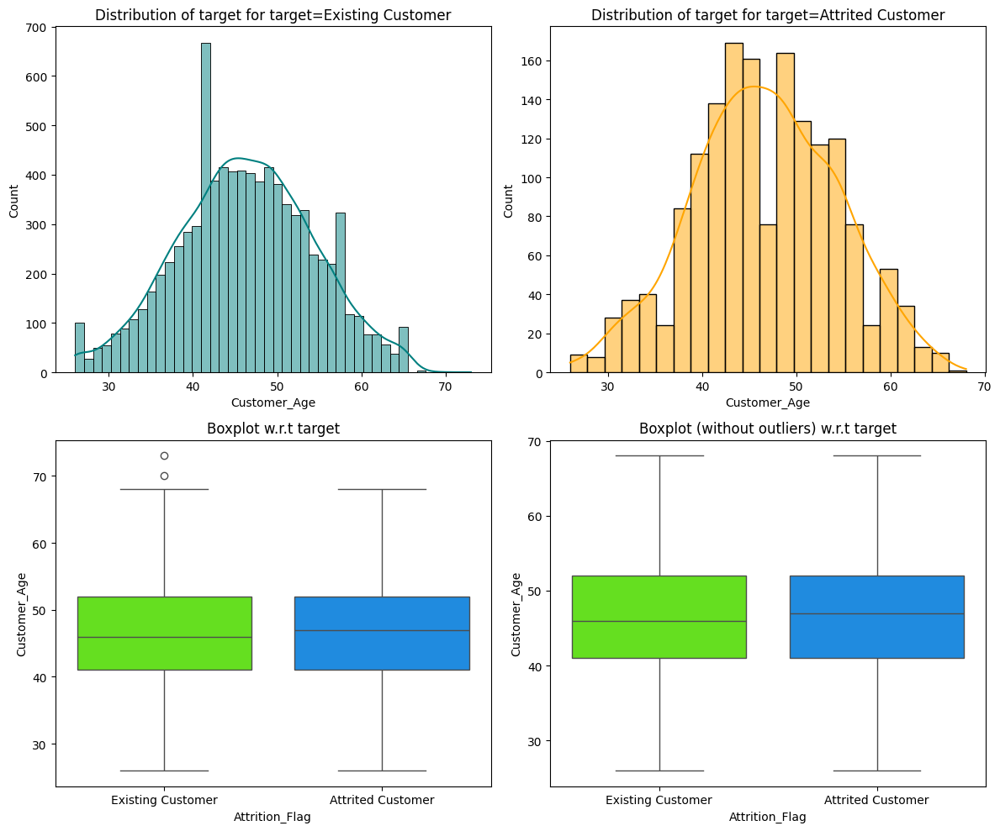

In [396]:
distribution_plot_wrt_target(cc_churn_df, "Customer_Age", "Attrition_Flag")

**Observations**
* Age does not appear to be a factor between existing and attrited customers. 

#### Dependent_count

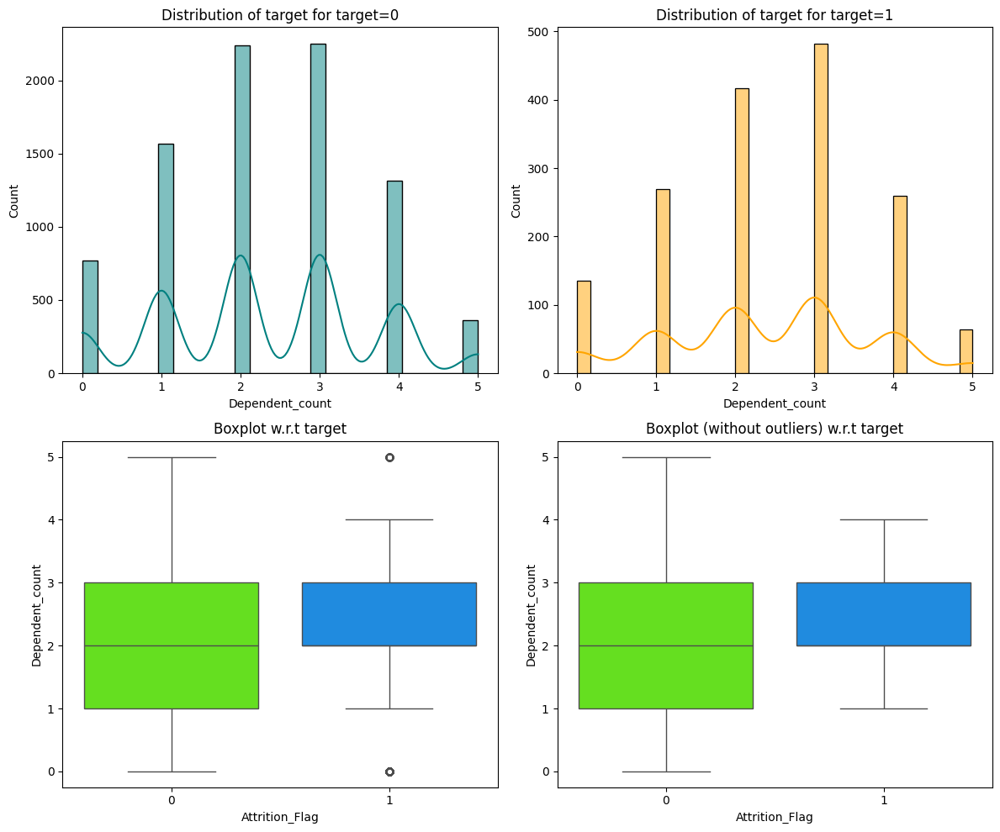

In [494]:
distribution_plot_wrt_target(cc_churn_df, "Dependent_count", "Attrition_Flag")

**Observations**
* Dependent count does not appear to be a factor between existing and attrited customers. 

#### Months_on_book

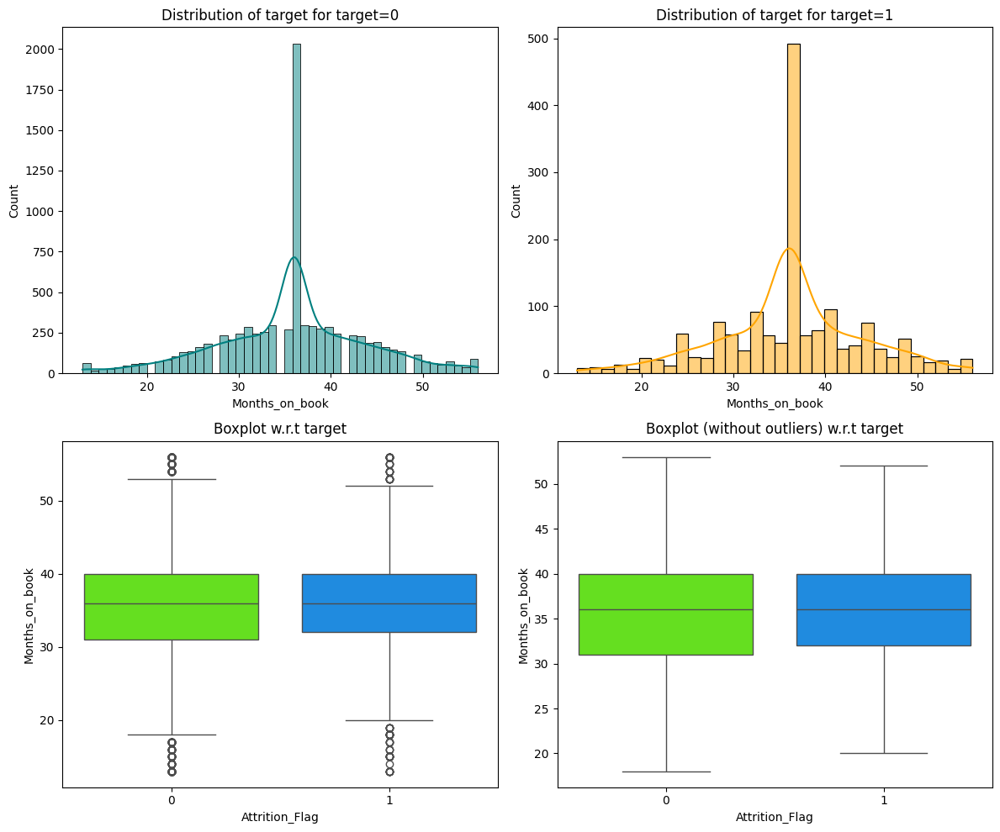

In [496]:
distribution_plot_wrt_target(cc_churn_df, "Months_on_book", "Attrition_Flag")

**Observations**
* Months on book (customer longevity) does not appear to be a factor between existing and attrited customers. 

#### Total_Relationship_Count

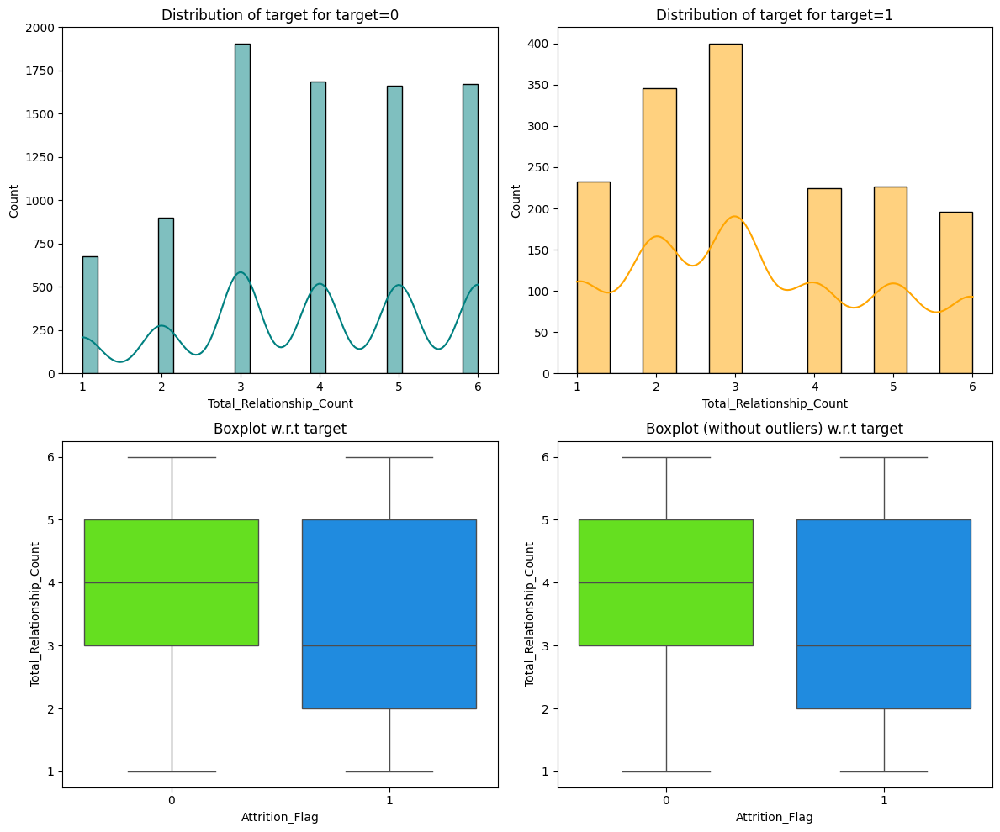

In [495]:
distribution_plot_wrt_target(cc_churn_df, "Total_Relationship_Count", "Attrition_Flag")

**Observations**
* Total relationship count (number of products) does not appear to be a factor between existing and attrited customers. 

#### Months_Inactive_12_mon

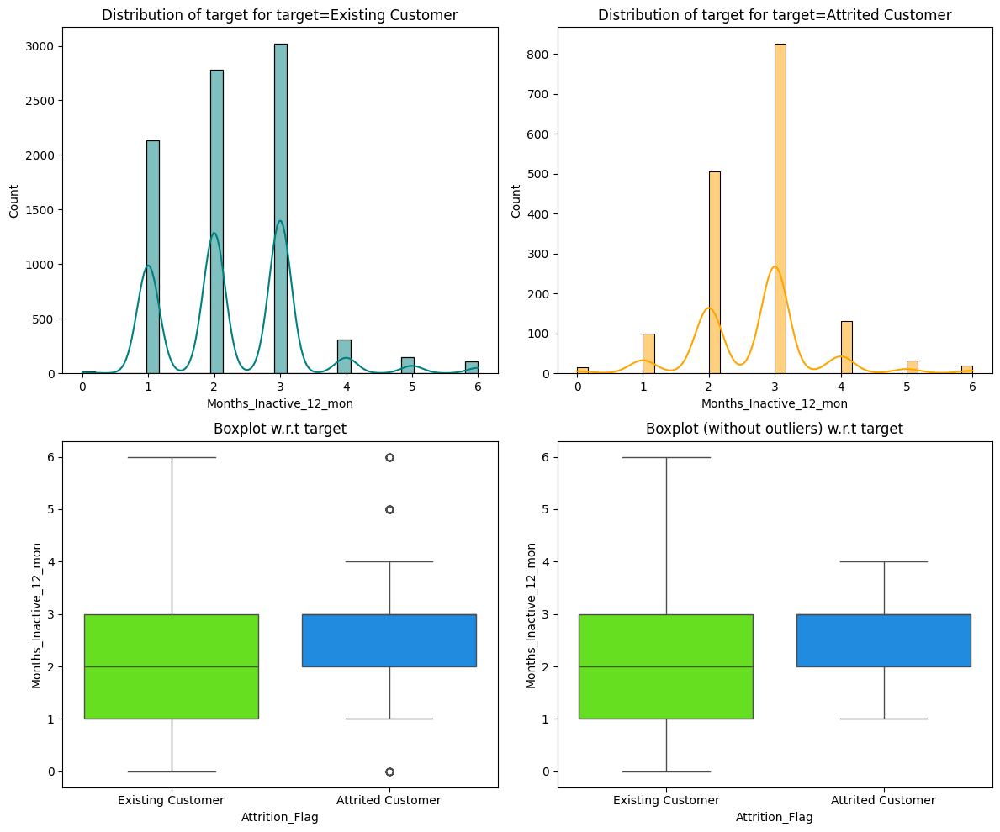

In [401]:
distribution_plot_wrt_target(cc_churn_df, "Months_Inactive_12_mon", "Attrition_Flag")

**Observations**
* Customers that have been inactive, not using, their credit card for at least 3 months are mostly like to be attrited.

#### Contacts_Count_12_mon

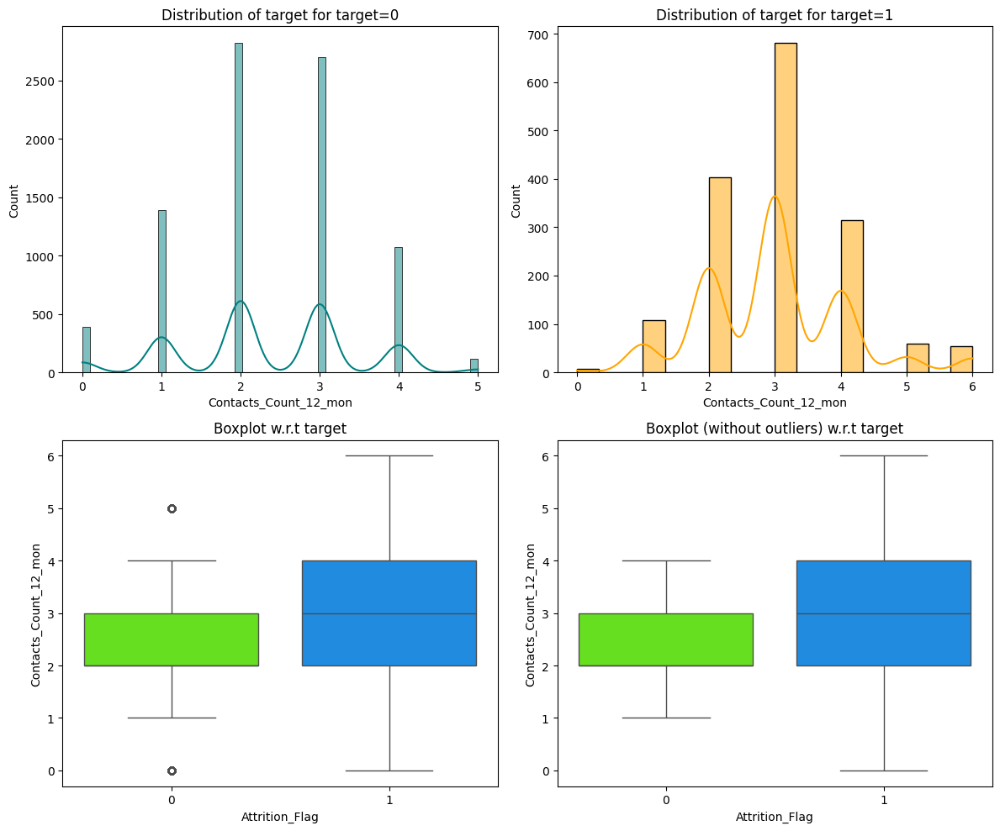

In [499]:
distribution_plot_wrt_target(cc_churn_df, "Contacts_Count_12_mon", "Attrition_Flag", )

**Observations**
* The number of times an attrited customer contacts Thera bank seems to have an impact on their retention. 

#### Credit_Limit

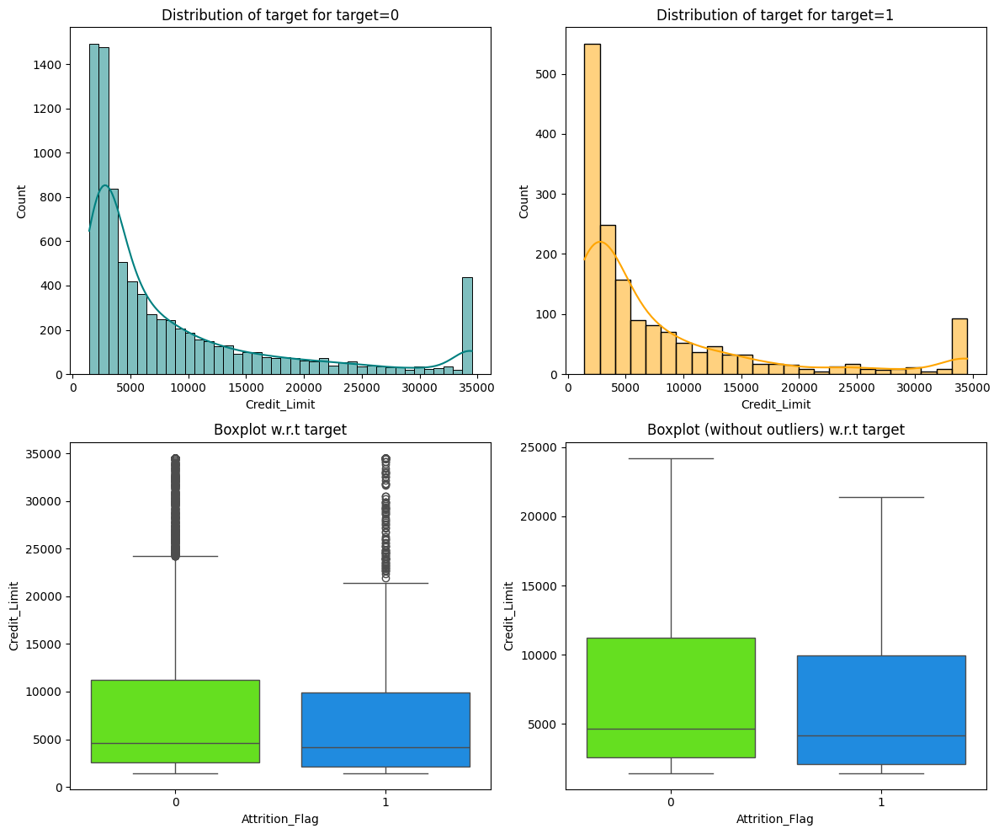

In [497]:
distribution_plot_wrt_target(cc_churn_df, "Credit_Limit", "Attrition_Flag")

**Observations**
* Majority of customers with lower credit limits are attrited with a spike in high credit limit customers being attrited.
* Right skewed distribution.

#### Total_Revolving_Bal

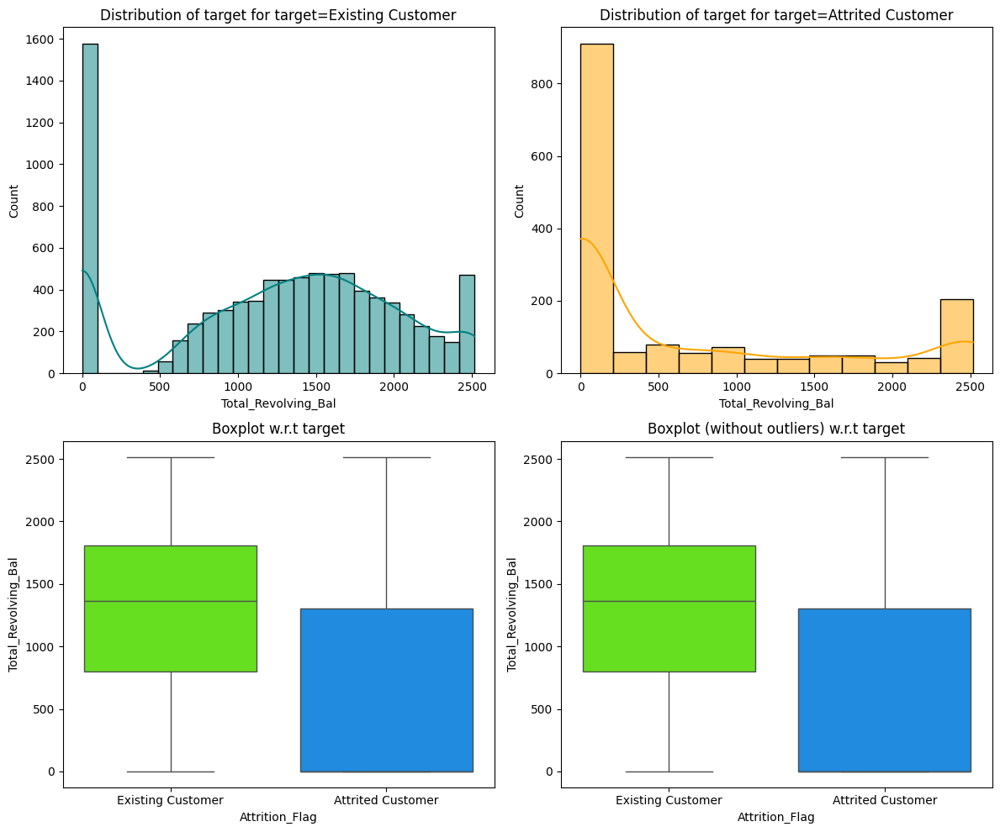

In [406]:
distribution_plot_wrt_target(cc_churn_df, "Total_Revolving_Bal", "Attrition_Flag")

**Observations**
* Customers with low credit balances are attrited mostly.

#### Avg_Open_To_Buy

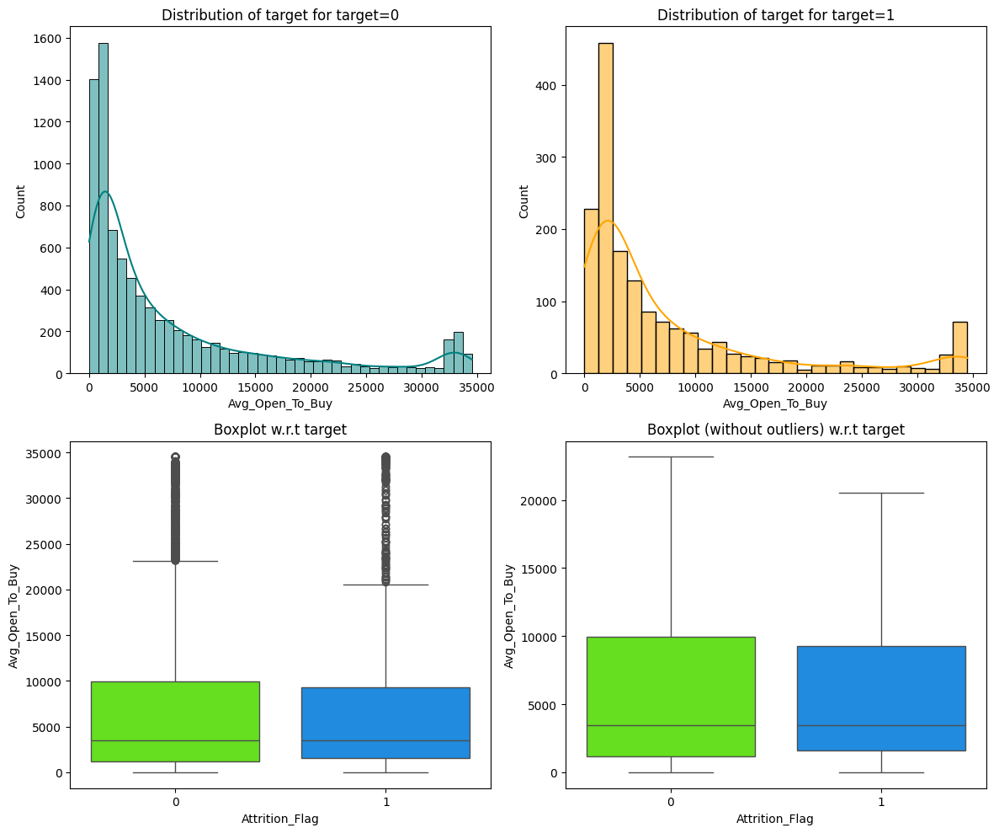

In [498]:
distribution_plot_wrt_target(cc_churn_df, "Avg_Open_To_Buy", "Attrition_Flag")

**Observations**
* Distribution is right skewed and shows light difference between existing and attrited customers. 

#### Total_Amt_Chng_Q4_Q1

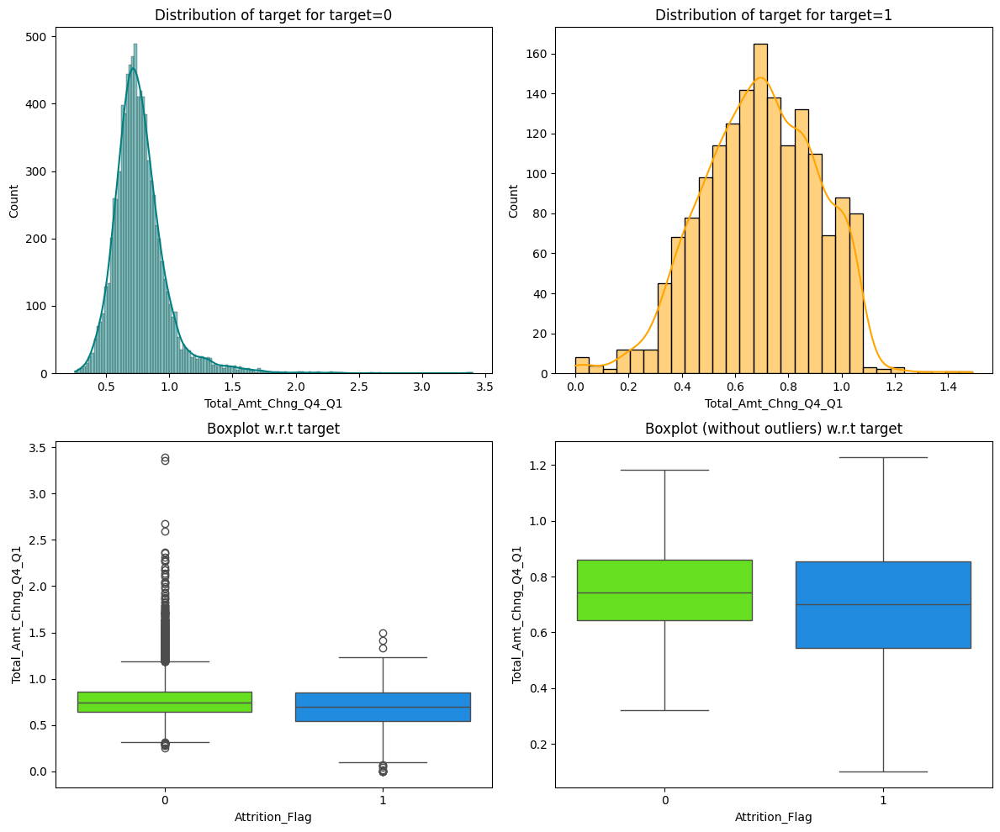

In [500]:
distribution_plot_wrt_target(cc_churn_df, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

**Observations**
* Attrited customers have a higher difference from Q4 to Q1 spending than existing customers. 

#### Total_Trans_Amt

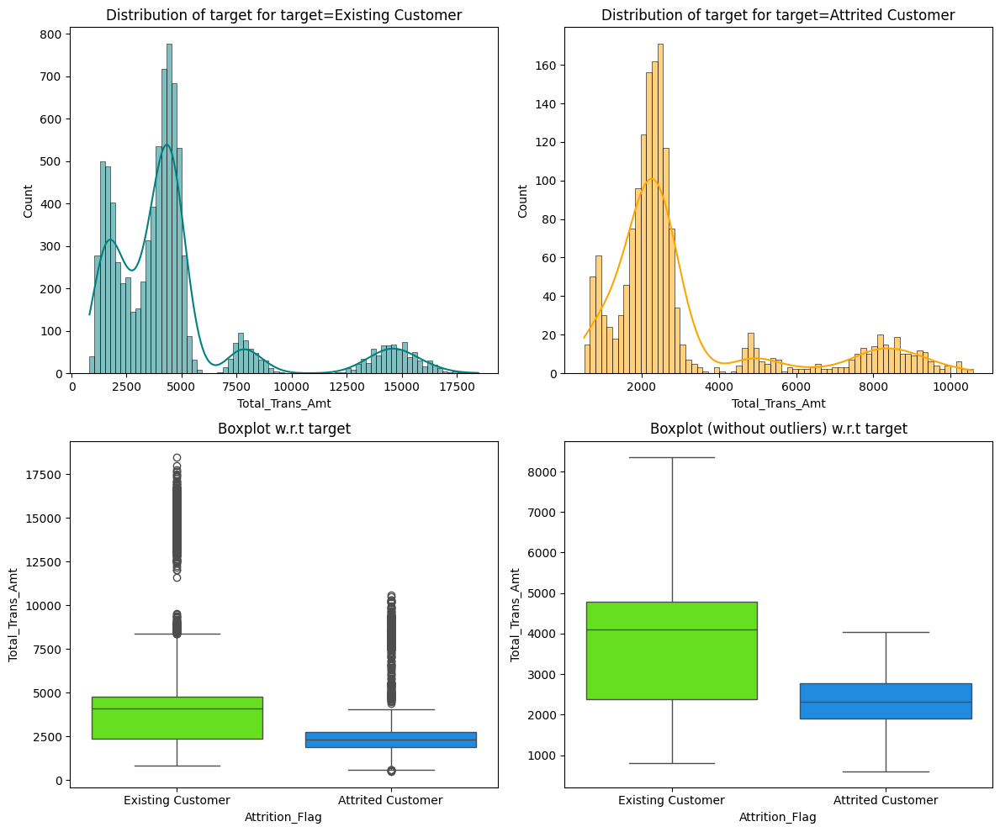

In [410]:
distribution_plot_wrt_target(cc_churn_df, "Total_Trans_Amt", "Attrition_Flag")

**Observations**
* Customers who have higher transactions amounts show a small tendency to be attrited.
* Customers who have lower transactions amounts shows where the majority of customers are attrited.

#### Total_Trans_Ct

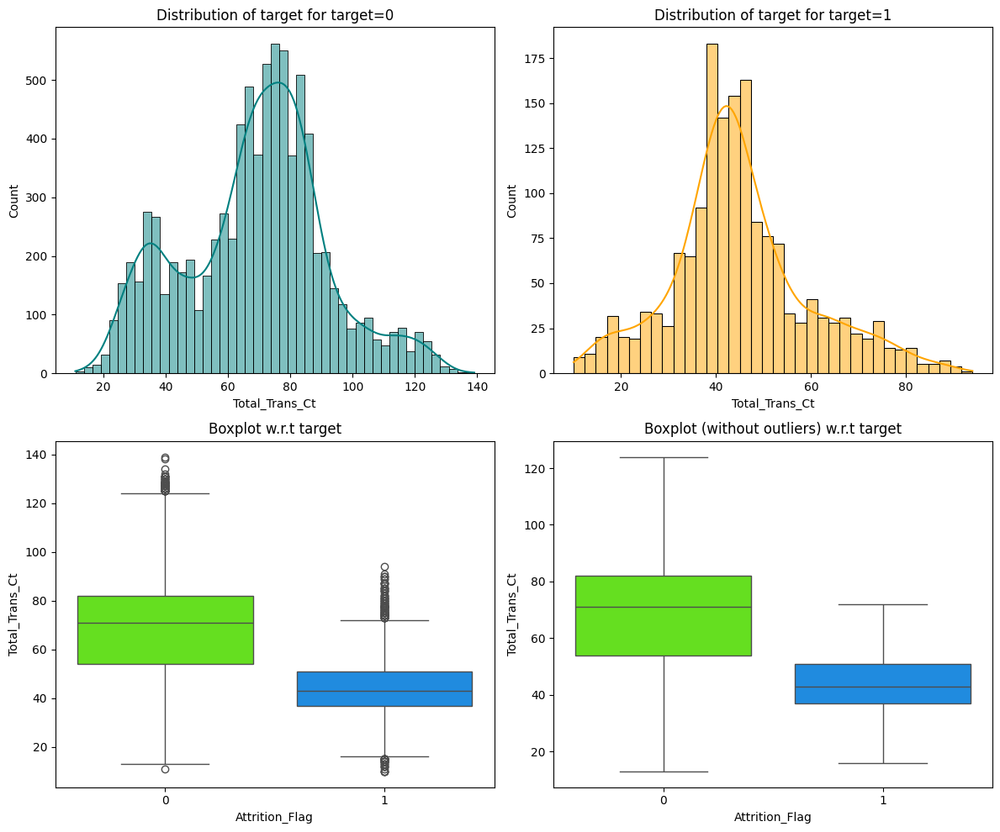

In [501]:
distribution_plot_wrt_target(cc_churn_df, "Total_Trans_Ct", "Attrition_Flag")

**Observations**
* Customers with low transaction counts tend to be attrited.

#### Total_Ct_Chng_Q4_Q1

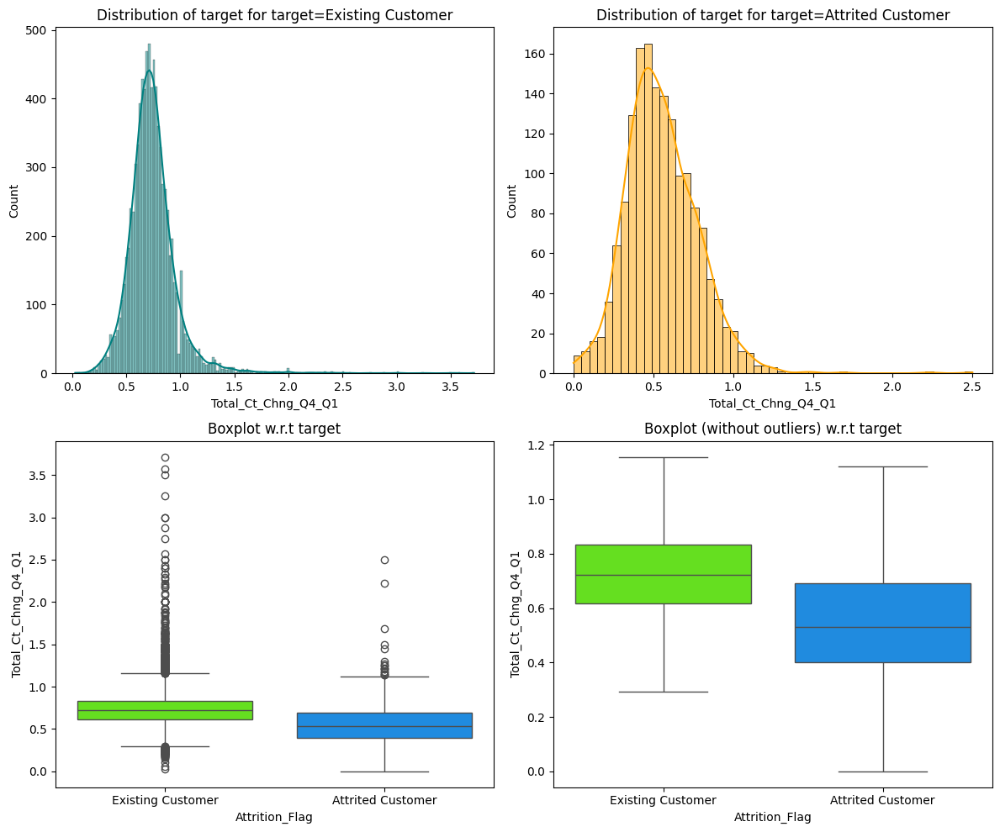

In [412]:
distribution_plot_wrt_target(cc_churn_df, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

**Observations**
* Attrited customers have a lower number of transactions from Q4 to Q1 than existing customers.

#### Avg_Utilization_Ratio

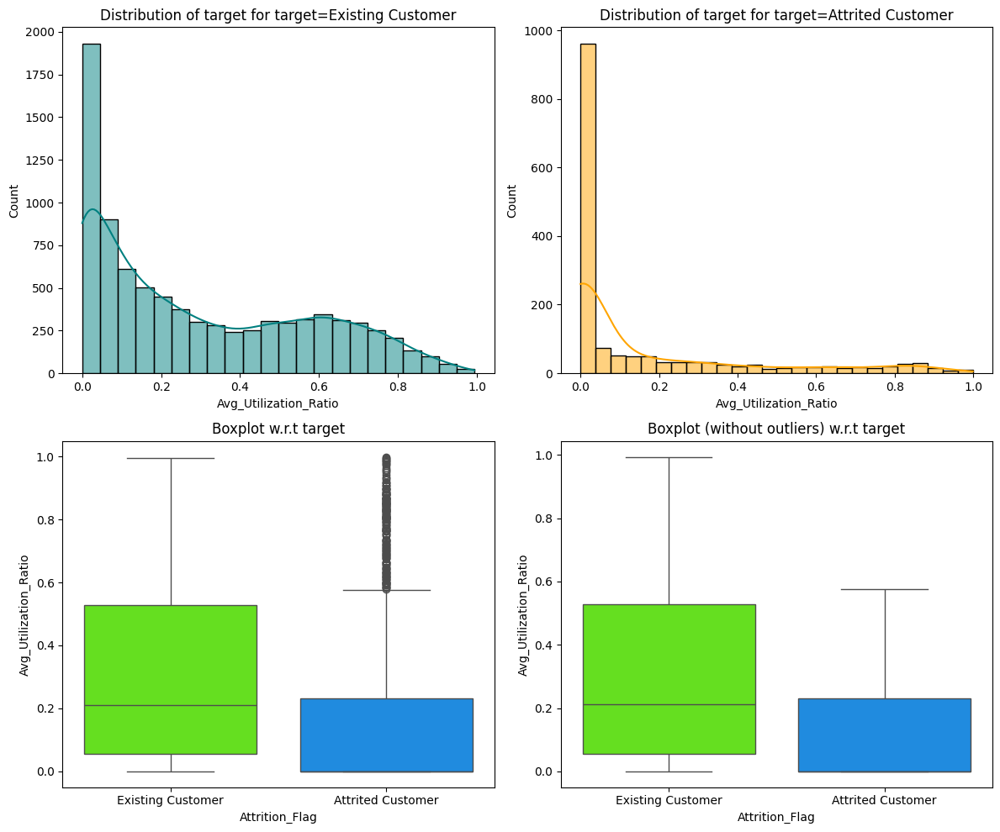

In [413]:
distribution_plot_wrt_target(cc_churn_df, "Avg_Utilization_Ratio", "Attrition_Flag")

**Observations**
* Existing customers use less of their credit line than attrited customers. 

### Categorical Values vs Predictor (Attrition_Flag)

In [ ]:
# Get columns of int64 and Float64 types.
cat_columns = cc_churn_df.select_dtypes(include=["object"]).columns

# Create a list of lists with column names and their data types.
cat_columns_table = [[col, cc_churn_df[col].dtype] for col in cat_columns]

print(tabulate(cat_columns_table, headers=["Column Names", "Data Type"], tablefmt="grid"))

+-----------------+-------------+
| Column Names    | Data Type   |
+=================+=============+
| Attrition_Flag  | object      |
+-----------------+-------------+
| Gender          | object      |
+-----------------+-------------+
| Education_Level | object      |
+-----------------+-------------+
| Marital_Status  | object      |
+-----------------+-------------+
| Income_Category | object      |
+-----------------+-------------+
| Card_Category   | object      |
+-----------------+-------------+


#### Gender

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------
Attrition_Flag  Attrited Customer  Existing Customer    All  \
Gender                                                        
All                          1627               8500  10127   
F                             930               4428   5358   
M                             697               4072   4769   

Attrition_Flag  Attrited Customer (%)  Existing Customer (%)  
Gender                                                        
All                               NaN                    NaN  
F                              17.357                 82.643  
M          

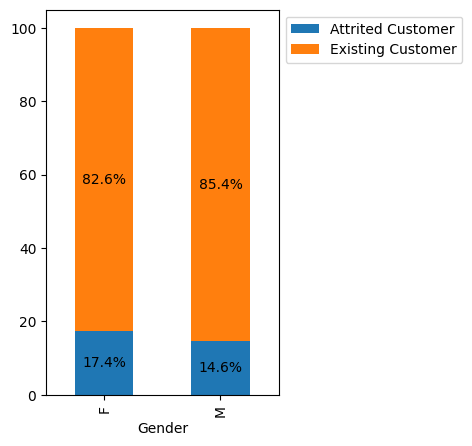

In [442]:
stacked_barplot(cc_churn_df, "Gender", "Attrition_Flag")

**Observations**
* Female and male customers do not show much of a difference between being an existing or attrited customer.

#### Education_Level

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------
Attrition_Flag   Attrited Customer  Existing Customer   All  \
Education_Level                                               
All                           1371               7237  8608   
Graduate                       487               2641  3128   
High School                    306               1707  2013   
Uneducated              

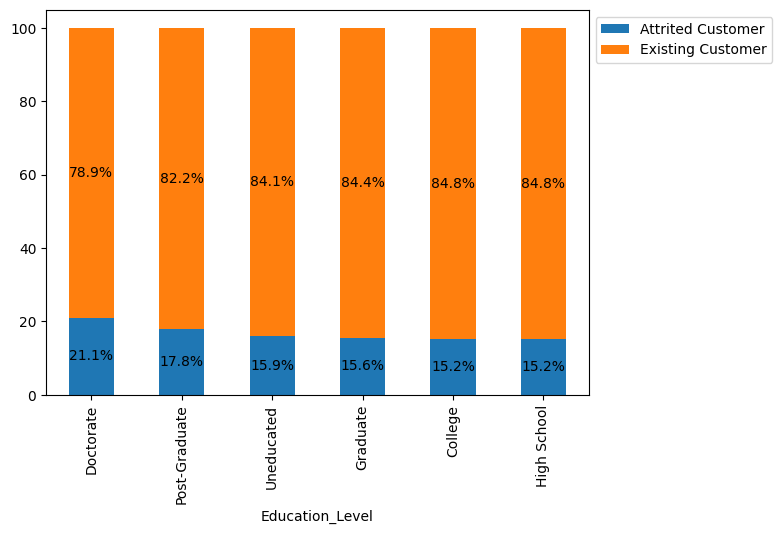

In [443]:
stacked_barplot(cc_churn_df, "Education_Level", "Attrition_Flag")

**Observations**
* Customers with doctorates and post-graduate degrees tend be the ones attrited.
* The uneducated, graduate, college and highschool educated customers have a very small difference in attrition.

#### Marital_Status

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------
Attrition_Flag  Attrited Customer  Existing Customer   All  \
Marital_Status                                               
All                          1498               7880  9378   
Married                       709               3978  4687   
Single                        668               3275  3943   
Divorced                      121                627   748   

Attrition_Flag  Attrited Customer (%)  Existing Customer (%)  
Marital_Status                                                
All                       

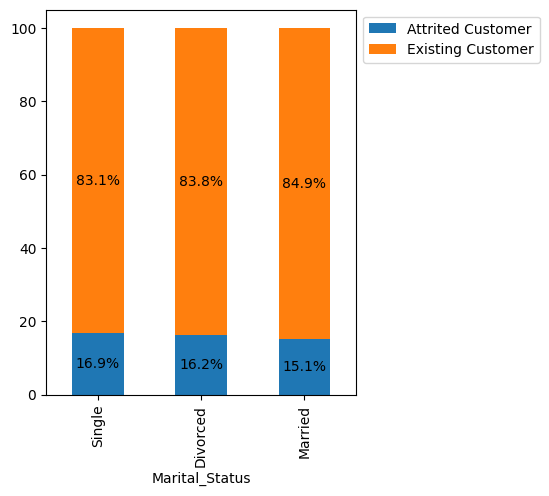

In [444]:
stacked_barplot(cc_churn_df, "Marital_Status", "Attrition_Flag")

**Observations**
* Very small difference between single, divorced and married customers for existing and attrited customers.

#### Income_Category

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------
Attrition_Flag   Attrited Customer  Existing Customer    All  \
Income_Category                                                
All                           1627               8500  10127   
Less than $40K                 612               2949   3561   
$40K - $60K                    271               1519   1790   
$80K - $12

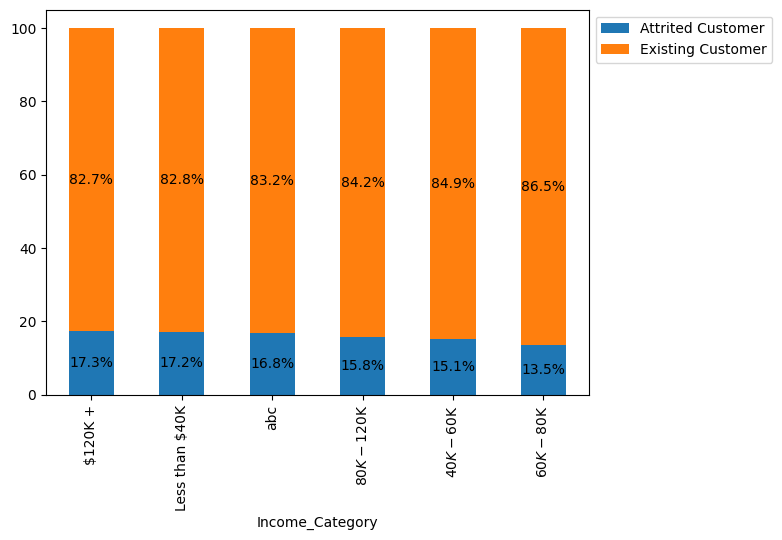

In [445]:
stacked_barplot(cc_churn_df, "Income_Category", "Attrition_Flag")

**Observations**
* Very small difference between attrited and existing customers based on income. 

#### Card_Category

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------
Attrition_Flag  Attrited Customer  Existing Customer    All  \
Card_Category                                                 
All                          1627               8500  10127   
Blue                         1519               7917   9436   
Silver                         82                473    555   
Gold                           21                 95    116   
Platinum                        5                 15     20   

Attrition_Flag  A

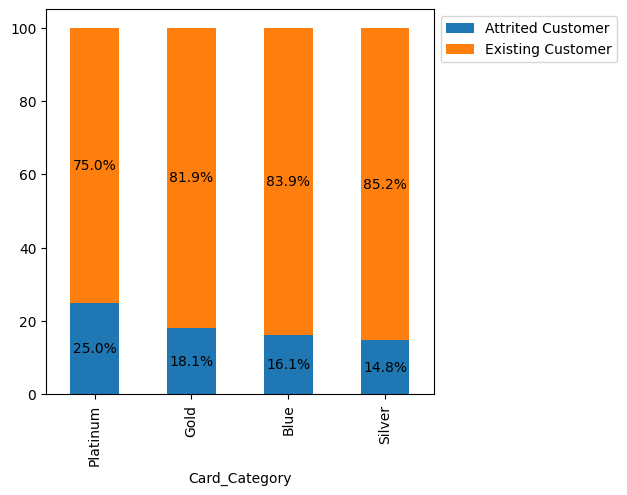

In [446]:
stacked_barplot(cc_churn_df, "Card_Category", "Attrition_Flag")

**Observations**
* Customers with Platinum and Gold cards tend to attrite more than Blue and Silver card holders.

---
## Multivariant Analysis

### Pairplot

<Figure size 1500x4100 with 0 Axes>

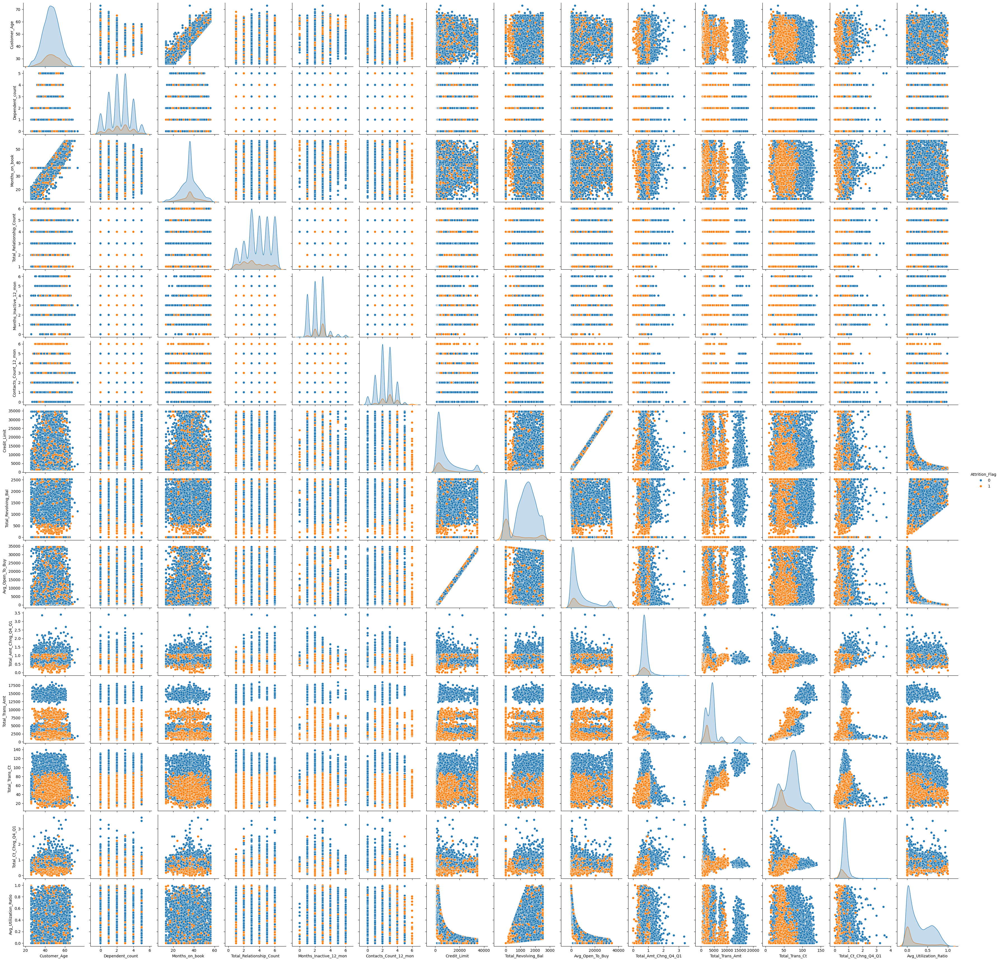

In [506]:
# Pairplot of the dataset.
plt.figure(figsize=(15,41))
sns.pairplot(cc_churn_df, hue="Attrition_Flag")
plt.show()

**Observations**
* The imbalance in the dataset as indicated by the Attrition_Flag chart makes it hard to predict customer churn accurately. There is a large bias towards existing customers (majority class).

### Correlation Matrix

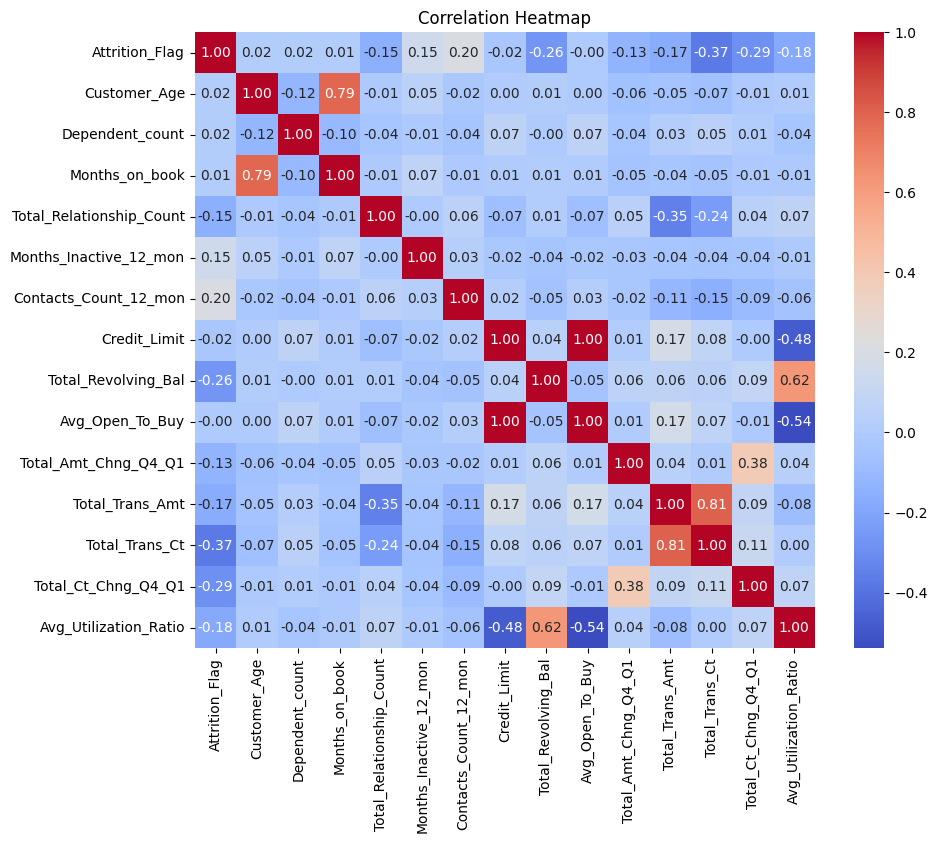

In [505]:
# Compute the correlation matrix.
corr_matrix = cc_churn_df.corr()

# Create the heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")

# Display the heatmap.
plt.title("Correlation Heatmap")
plt.show()

**Observations**
* The Credit_Limit and Avg_Open_To_Buy variables are very strongy correlated.
* Customer_age and Months_on_book have a 0.79 correlation coefficient indicating a strong positive relationship as it is close to 1.00. 
* Total_Revolving_Bal and Avg_Utilization_Ration have a 0.62 correlation coefficient and shows a moderate correlation. 
* Total_Trans_Ct and Total_Trans_Amt have a strong correlation with 0.81. 

---
---
# Data Pre-processing

In [ ]:
# As mentioned in the Data Overview section the CLIENTNUM column does not have impact on the analysis.
cc_churn_df.drop("CLIENTNUM", axis=1, inplace=True)
cc_churn_df.reset_index(drop=True, inplace=True)

In [37]:
# Return the first few rows of the dataset.
cc_churn_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [38]:
# Return the last few rows of the dataset.
cc_churn_df.tail()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


**INFORMATION:** Attrition_Flag needs to label encoding for "Existing" and "Attrited" customers as shown in the .head() and .tail() results.

In [41]:
# Replace categorical values with 0 and 1
cc_churn_df["Attrition_Flag"].replace({"Existing Customer": 0, "Attrited Customer": 1}, inplace=True)

In [42]:
# Filter the DataFrame where Attrition_Flag is 0 or 1.
attrition_type_df = cc_churn_df[cc_churn_df["Attrition_Flag"].isin([0, 1])]

# Get the count of 0s (Existing Customers).
count_0 = (attrition_type_df["Attrition_Flag"] == 0).sum()

# Get the count of 1s (Attrited Customers).
count_1 = (attrition_type_df["Attrition_Flag"] == 1).sum()

print(f"Count of 0s (Existing Cutomers): {count_0}")
print(f"Count of 1s (Attrited Customers): {count_1}")


Count of 0s (Existing Cutomers): 8500
Count of 1s (Attrited Customers): 1627


In [82]:
Q1 = cc_churn_df.quantile(0.25)  # To find the 25th percentile
Q3 = cc_churn_df.quantile(0.75)  # To find the 75th percentile

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)

# Checking the % outliers.
((cc_churn_df.select_dtypes(include=["float64", "int64"]) < lower) | (cc_churn_df.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(cc_churn_df) * 100

Attrition_Flag             16.066
Customer_Age                0.020
Dependent_count             0.000
Months_on_book              3.812
Total_Relationship_Count    0.000
Months_Inactive_12_mon      3.268
Contacts_Count_12_mon       6.211
Credit_Limit                9.717
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             9.509
Total_Amt_Chng_Q4_Q1        3.910
Total_Trans_Amt             8.848
Total_Trans_Ct              0.020
Total_Ct_Chng_Q4_Q1         3.891
Avg_Utilization_Ratio       0.000
dtype: float64

## Missing value imputation




### Replace Missing Values

In [43]:
# Get the number of abc records in the dataset.
abc_count = cc_churn_df[cc_churn_df['Income_Category'] == 'abc']['Income_Category'].count()
print("Number of abc records to replace: " + str(abc_count))


Number of abc records to replace: 1112


In [46]:
# Replace 'abc' with NaN in the Income_Category column.
cc_churn_df["Income_Category"].replace("abc", np.nan, inplace=True)

In [47]:
# Get the number of abc records in the dataset.
abc_count = cc_churn_df[cc_churn_df['Income_Category'] == 'abc']['Income_Category'].count()
print("Number of abc records to replace: " + str(abc_count))

Number of abc records to replace: 0


### Imputation

In [52]:
# Replace missing using the most frequent value.
cc_churn_imputer = SimpleImputer(strategy="most_frequent")

In [48]:
# Separate features (input variables) from the target variable (Attrition_Flag).
X = cc_churn_df.drop(["Attrition_Flag"], axis=1)
y = cc_churn_df["Attrition_Flag"]

In [49]:
# Split the data into training, validation and testing sets.

# Split the data into training and testing sets.
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# Split X_temp and y_temp into training and validation sets.
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [50]:
# Impute missing values.
col_to_impute = ["Education_Level", "Marital_Status", "Income_Category"]

In [53]:
# Fit and transform the train data.
X_train[col_to_impute] = cc_churn_imputer.fit_transform(X_train[col_to_impute])

# Transform the validation data.
X_val[col_to_impute] = cc_churn_imputer.transform(X_val[col_to_impute])

# Transform the test data.
X_test[col_to_impute] = cc_churn_imputer.transform(X_test[col_to_impute])

In [54]:
# Check for missing values in the training, validation and test sets.
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

In [57]:
# Check for missing values in the training set.
xtrain_cols = X_train.select_dtypes(include=["object", "category"])
for i in xtrain_cols.columns:
    print(X_train[i].value_counts())
    print("\n")

F    3193
M    2882
Name: Gender, dtype: int64


Graduate         2782
High School      1228
Uneducated        881
College           618
Post-Graduate     312
Doctorate         254
Name: Education_Level, dtype: int64


Married     3276
Single      2369
Divorced     430
Name: Marital_Status, dtype: int64


Less than $40K    2783
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
$120K +            449
Name: Income_Category, dtype: int64


Blue        5655
Silver       339
Gold          69
Platinum      12
Name: Card_Category, dtype: int64




In [59]:
# Check for missing values in the validation set.
xval_cols = X_val.select_dtypes(include=["object", "category"])
for i in xval_cols.columns:
    print(X_val[i].value_counts())
    print("\n")

F    1095
M     931
Name: Gender, dtype: int64


Graduate         917
High School      404
Uneducated       306
College          199
Post-Graduate    101
Doctorate         99
Name: Education_Level, dtype: int64


Married     1100
Single       770
Divorced     156
Name: Marital_Status, dtype: int64


Less than $40K    957
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
$120K +           136
Name: Income_Category, dtype: int64


Blue        1905
Silver        97
Gold          21
Platinum       3
Name: Card_Category, dtype: int64




In [60]:
# Check for missing values in the test set.
xtest_cols = X_test.select_dtypes(include=["object", "category"])
for i in xtest_cols.columns:
    print(X_test[i].value_counts())
    print("\n")

F    1070
M     956
Name: Gender, dtype: int64


Graduate         948
High School      381
Uneducated       300
College          196
Post-Graduate    103
Doctorate         98
Name: Education_Level, dtype: int64


Married     1060
Single       804
Divorced     162
Name: Marital_Status, dtype: int64


Less than $40K    933
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
$120K +           142
Name: Income_Category, dtype: int64


Blue        1876
Silver       119
Gold          26
Platinum       5
Name: Card_Category, dtype: int64




In [64]:
# Encode categorical columns.
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)

print(X_train.shape, X_val.shape, X_test.shape)

(6075, 29) (2026, 29) (2026, 29)


In [65]:
X_train.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
800,40,2,21,6,4,3,20056.000,1602,18454.000,0.466,1687,46,0.533,0.080,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0
498,44,1,34,6,2,0,2885.000,1895,990.000,0.387,1366,31,0.632,0.657,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0
4356,48,4,36,5,1,2,6798.000,2517,4281.000,0.873,4327,79,0.881,0.370,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0
407,41,2,36,6,2,0,27000.000,0,27000.000,0.610,1209,39,0.300,0.000,1,0,1,0,0,0,1,0,0,1,0,0,0,0,1
8728,46,4,36,2,2,3,15034.000,1356,13678.000,0.754,7737,84,0.750,0.090,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1


In [66]:
X_val.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
2894,37,0,27,5,2,3,15326.000,0,15326.000,1.159,2990,55,0.964,0.000,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0
9158,58,2,46,1,3,1,10286.000,0,10286.000,0.908,8199,59,0.903,0.000,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0
9618,42,3,23,3,4,3,34516.000,2070,32446.000,0.880,13781,102,0.545,0.060,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0
9910,47,3,36,3,2,3,9683.000,1116,8567.000,0.721,15627,104,0.825,0.115,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0
5497,60,1,36,5,2,2,2688.000,1617,1071.000,0.552,4183,71,0.614,0.602,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0


In [67]:
X_test.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
9760,32,1,26,2,3,2,6407.000,1130,5277.000,0.756,14471,93,0.603,0.176,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0
7413,50,1,36,4,3,2,2317.000,0,2317.000,0.734,2214,41,0.519,0.000,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0
6074,54,2,36,3,3,3,3892.000,0,3892.000,0.738,4318,74,0.762,0.000,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0
3520,61,0,36,4,3,4,24172.000,2517,21655.000,0.424,1658,27,0.500,0.104,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0
6103,41,3,15,5,3,4,4312.000,2517,1795.000,0.741,2693,56,0.436,0.584,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0


---
---
# Model Building

## Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

## Helper Functions

**INFORMATION:** --- Execute all helper function cells before starting model building.

#### Function to compute different metrics to check performance of a classification model built using sklearn

In [68]:
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

#### Function to create confusion matrix

In [73]:
# Function to create confusion matrix.
def make_confusion_matrix(model,predictors,y_actual,labels=[0, 1]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth

    '''
    y_predict = model.predict(predictors)
    cm=confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

#### Function display the model performance scores and confusion matrices

In [74]:
# Function to display the model performance scores and confusion metrics.
def display_metrics(model_instance_list,list_index,train_set=False,val_set=False,X_train_set=X_train,y_train_set=y_train,X_val_set=X_val,y_val_set=y_val):
  model_instance = model_instance_list[list_index][1]
  model_instance_name = model_instance_list[list_index][0]
  print("Model Name:",model_instance_name,"\n")
  if train_set==True:
    print("Training Performance:")
    model_performance_train_set = model_performance_classification_sklearn(model_instance, X_train_set, y_train_set)
    print(model_performance_train_set.head(),"\n")
    make_confusion_matrix(model_instance,X_train_set, y_train_set)

  if val_set == True:
    print("Validation Performance:")
    model_performance_train_set = model_performance_classification_sklearn(model_instance, X_val_set, y_val_set)
    print(model_performance_train_set)
    make_confusion_matrix(model_instance,X_val_set, y_val_set)

  return model_performance_train_set

#### Function return the train models list

In [ ]:
# This function return the train models list.
def get_model_instance_list(X_training_data_set,y_training_data_set):
    models = []  # Empty list to store all the models

    # Appending models into the list
    models.append(("Bagging", BaggingClassifier(random_state=1)))
    models.append(("Random forest", RandomForestClassifier(random_state=1)))
    models.append(("Gradient Boosting", GradientBoostingClassifier(random_state=1)))
    models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
    models.append(("dtree", DecisionTreeClassifier(random_state=1)))
    models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

    models_instance_list=[]

    for name, model in models:
        models_instance_list.append((name,model.fit(X_training_data_set, y_training_data_set)))

    return models_instance_list

## Model Building with original data

In [71]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Gradient Boosting", GradientBoostingClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.985655737704918
Random forest: 1.0
Gradient Boosting: 0.875
AdaBoost: 0.826844262295082
dtree: 1.0
Xgboost: 1.0

Validation Performance:

Bagging: 0.8098159509202454
Random forest: 0.7975460122699386
Gradient Boosting: 0.8588957055214724
AdaBoost: 0.852760736196319
dtree: 0.8098159509202454
Xgboost: 0.901840490797546


In [90]:
# Get list of models.
cc_churn_train_models = get_model_instance_list(X_train,y_train)
print(cc_churn_train_models)

[('Bagging', BaggingClassifier(random_state=1)), ('Random forest', RandomForestClassifier(random_state=1)), ('Gradient Boosting', GradientBoostingClassifier(random_state=1)), ('AdaBoost', AdaBoostClassifier(random_state=1)), ('dtree', DecisionTreeClassifier(random_state=1)), ('Xgboost', XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=Non

#### Bagging

Model Name: Bagging 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.997   0.986      0.997 0.991 



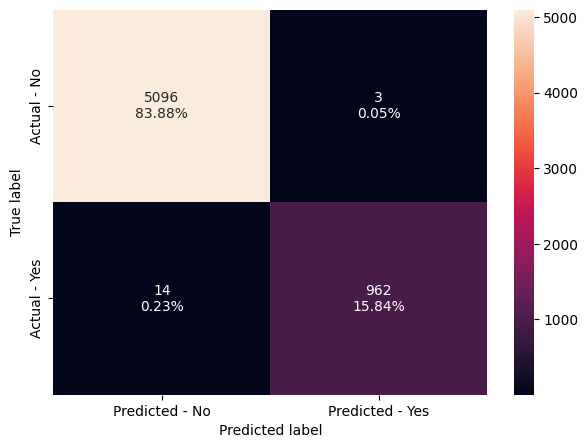

In [102]:
# Training set performance.
perf_BAG_train_set = display_metrics(cc_churn_train_models,0,train_set=True)

Model Name: Bagging 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.956   0.810      0.904 0.854


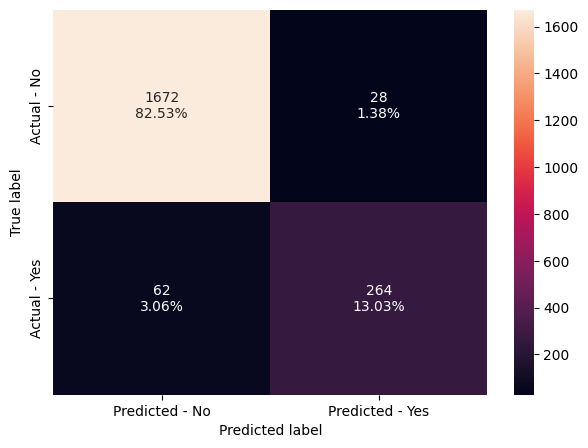

In [103]:
# Validation set performance.
perf_BAG_val_set = display_metrics(cc_churn_train_models,0,val_set=True)

**Observations**
* Model is overfitting.

#### Decision Tree

Model Name: dtree 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



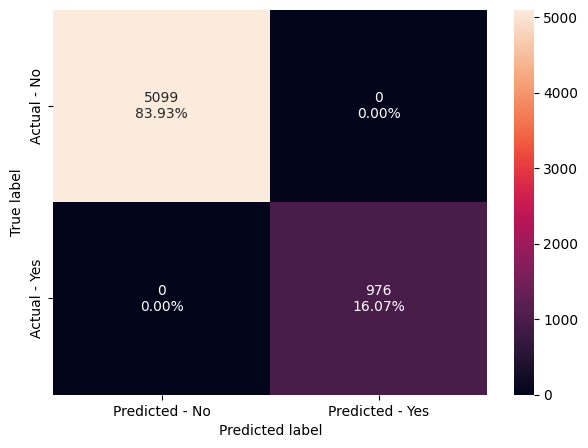

In [104]:
# Training set performance.
perf_DT_train_set = display_metrics(cc_churn_train_models,4,train_set=True)

Model Name: dtree 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.939   0.810      0.810 0.810


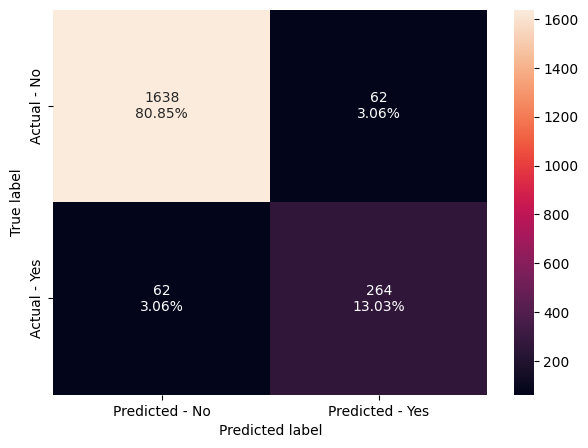

In [105]:
# Validation set performance.
perf_DT_val_set = display_metrics(cc_churn_train_models,4,val_set=True)

**Observations**
* Model is overfitting.

#### AdaBoost

Model Name: AdaBoost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.957   0.827      0.900 0.862 



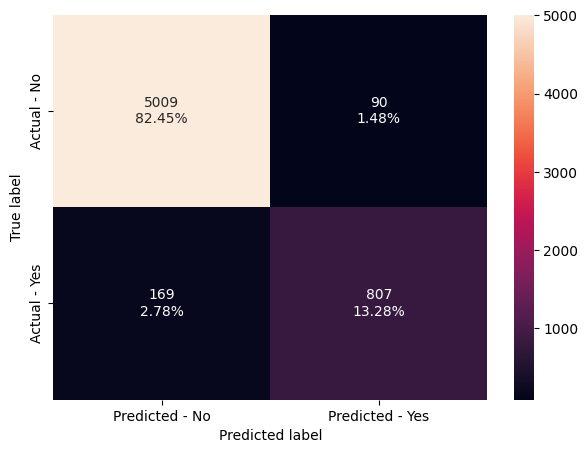

In [106]:
# Training set performance.
perf_AB_train_set = display_metrics(cc_churn_train_models,3,train_set=True)

Model Name: AdaBoost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.962   0.853      0.906 0.878


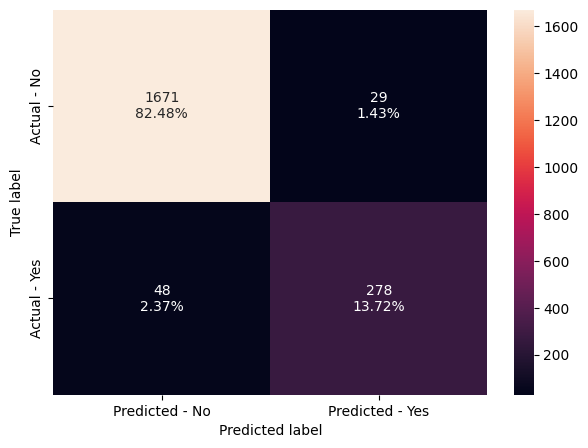

In [107]:
# Validation set performance.
perf_AB_val_set = display_metrics(cc_churn_train_models,3,val_set=True)

**Observations**
* This model is well fitted. 

#### XGBoost

Model Name: Xgboost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



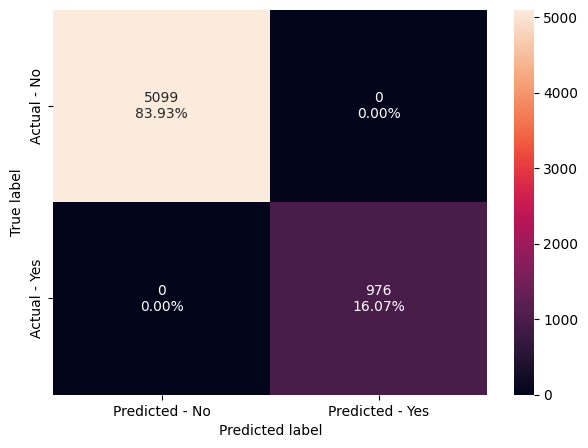

In [108]:
# Training set performance.
perf_XG_train_set = display_metrics(cc_churn_train_models,5,train_set=True)

Model Name: Xgboost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.971   0.902      0.919 0.910


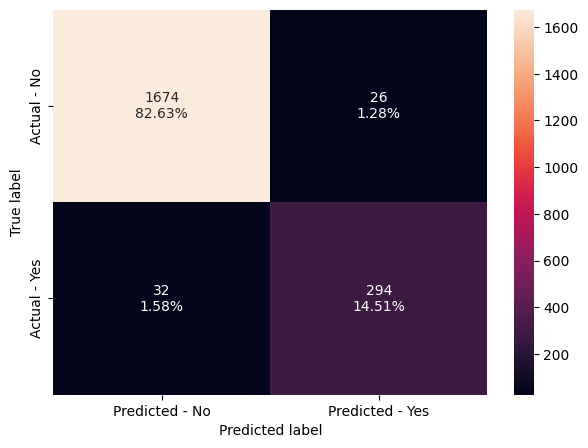

In [109]:
# Validation set performance.
perf_XG_val_set = display_metrics(cc_churn_train_models,5,val_set=True)

**Observations**
* Model is overfitting.

#### GradientBoost

Model Name: Gradient Boosting 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.973   0.875      0.952 0.912 



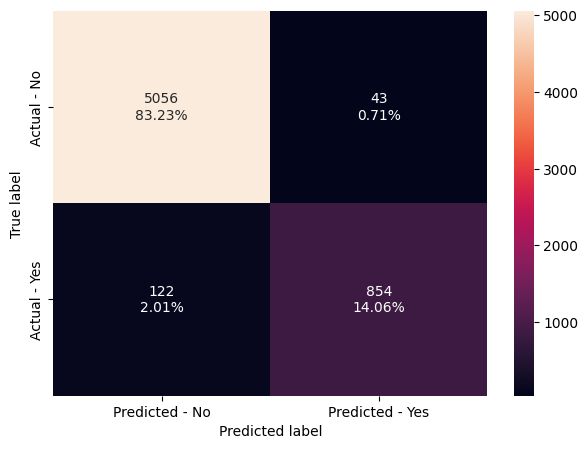

In [110]:
# Training set performance.
perf_GB_train_set = display_metrics(cc_churn_train_models,2,train_set=True)

Model Name: Gradient Boosting 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.968   0.859      0.936 0.896


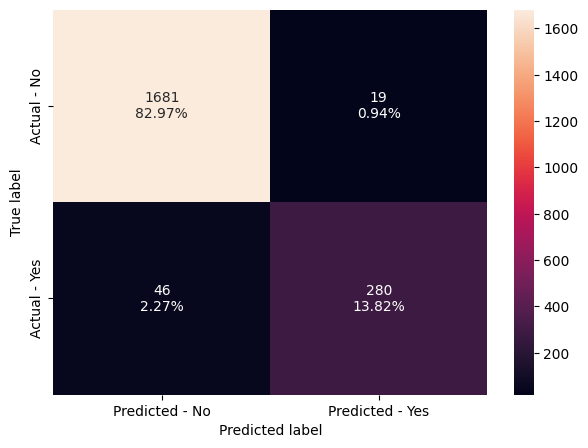

In [111]:
# Validation set performance.
perf_GB_val_set = display_metrics(cc_churn_train_models,2,val_set=True)

**Observations**
* This model is well fitted. 

#### Random Forest

Model Name: Random forest 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



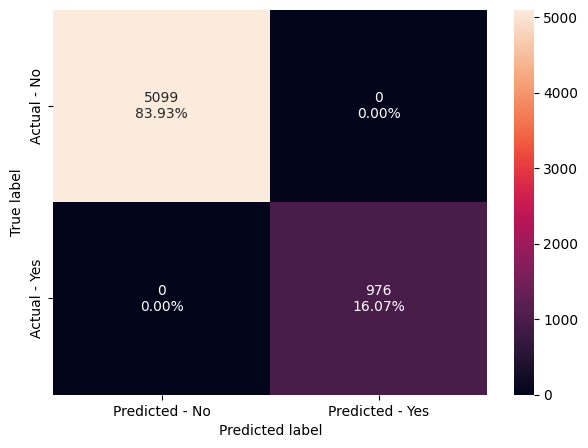

In [112]:
# Training set performance.
perf_RF_train_set = display_metrics(cc_churn_train_models,1,train_set=True)

Model Name: Random forest 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.957   0.798      0.922 0.855


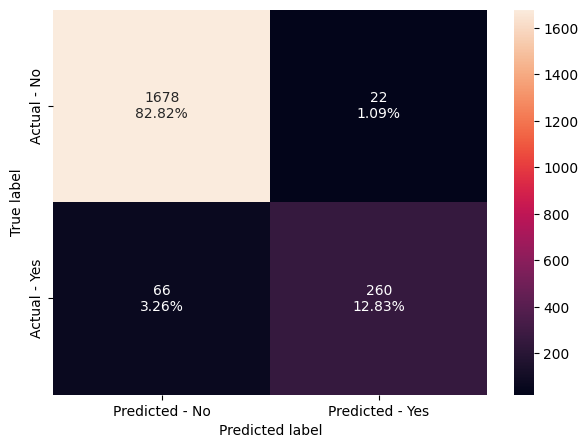

In [113]:
# Validation set performance.
perf_RF_val_set = display_metrics(cc_churn_train_models,1,val_set=True)

**Observations**
* This model is overfitting.

## Model Building with Oversampled data


In [114]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Yes': 976
Before Oversampling, counts of label 'No': 5099 

After Oversampling, counts of label 'Yes': 5099
After Oversampling, counts of label 'No': 5099 

After Oversampling, the shape of train_X: (10198, 29)
After Oversampling, the shape of train_y: (10198,) 



In [115]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Gradient Boosting", GradientBoostingClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9974504804863699
Random forest: 1.0
Gradient Boosting: 0.980976662090606
AdaBoost: 0.9690135320651108
dtree: 1.0
Xgboost: 1.0

Validation Performance:

Bagging: 0.8496932515337423
Random forest: 0.8680981595092024
Gradient Boosting: 0.8926380368098159
AdaBoost: 0.901840490797546
dtree: 0.8251533742331288
Xgboost: 0.911042944785276


In [116]:
# Get list of models.
cc_churn_train_over_models = get_model_instance_list(X_train_over,y_train_over)
print(cc_churn_train_over_models)

[('Bagging', BaggingClassifier(random_state=1)), ('Random forest', RandomForestClassifier(random_state=1)), ('Gradient Boosting', GradientBoostingClassifier(random_state=1)), ('AdaBoost', AdaBoostClassifier(random_state=1)), ('dtree', DecisionTreeClassifier(random_state=1)), ('Xgboost', XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=Non

#### Bagging

Model Name: Bagging 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.998   0.994      0.994 0.994 



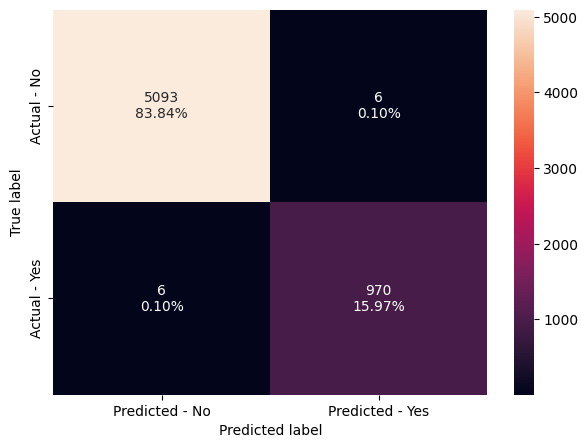

In [117]:
over_BAG_train_set = display_metrics(cc_churn_train_over_models,0,train_set=True)

Model Name: Bagging 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.943   0.850      0.805 0.827


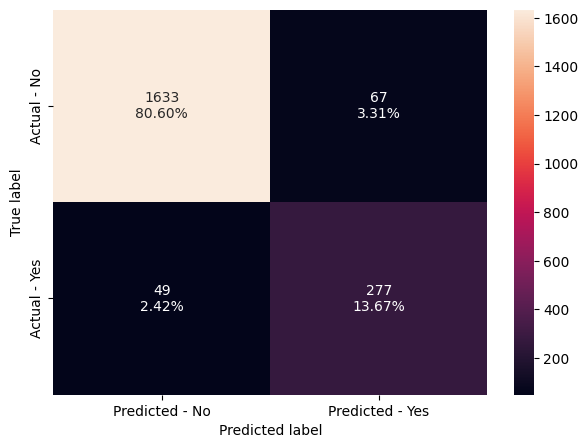

In [118]:
over_BAG_val_set = display_metrics(cc_churn_train_over_models,0,val_set=True)

**Observations**
* This model is overfitting.

#### Decision Tree

Model Name: dtree 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



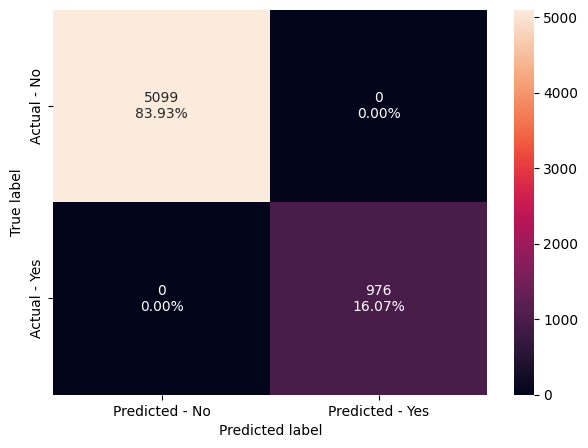

In [119]:
over_DT_train_set = display_metrics(cc_churn_train_over_models,4,train_set=True)

Model Name: dtree 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.929   0.825      0.756 0.789


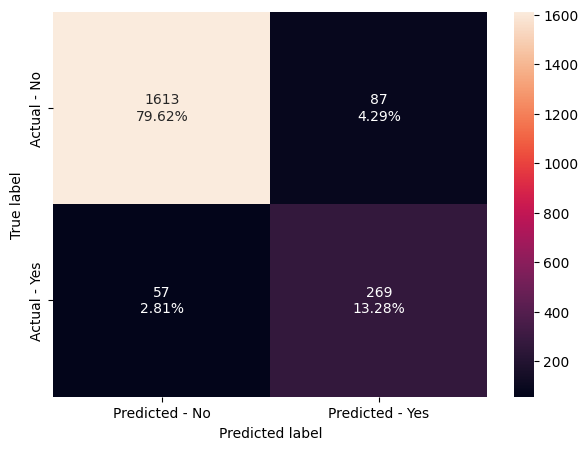

In [120]:
over_DT_val_set = display_metrics(cc_churn_train_over_models,4,val_set=True)

**Observations**
* This model is overfitting.

#### AdaBoost

Model Name: AdaBoost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.944   0.893      0.787 0.837 



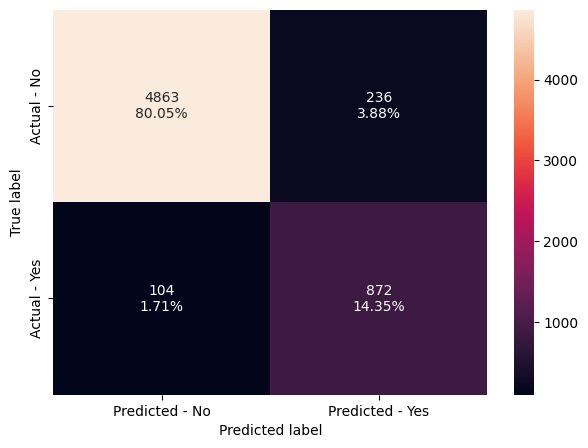

In [121]:
over_AB_train_set = display_metrics(cc_churn_train_over_models,3,train_set=True)

Model Name: AdaBoost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.944   0.902      0.784 0.839


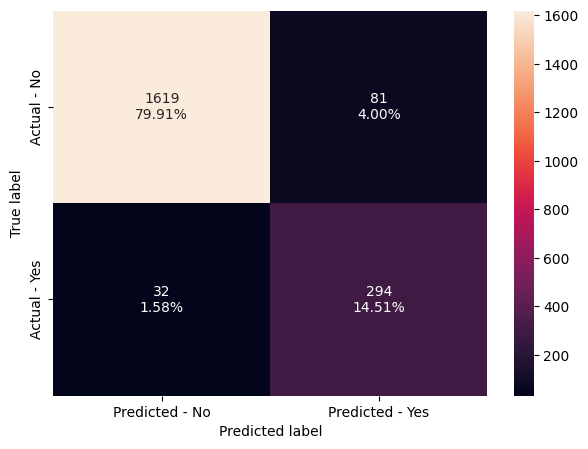

In [122]:
over_AB_val_set = display_metrics(cc_churn_train_over_models,3,val_set=True)

**Observations**
* This model is well fitted. 

#### XGBoost

Model Name: Xgboost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



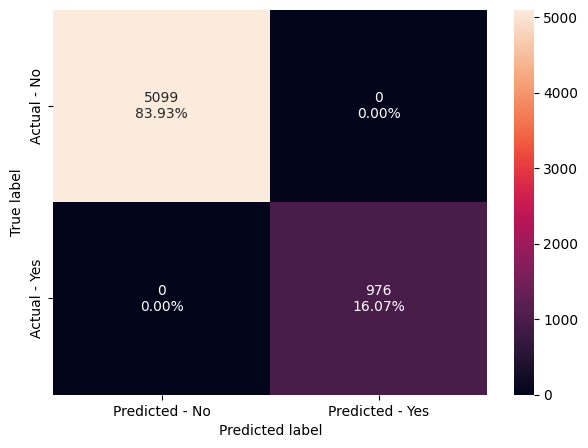

In [123]:
over_XG_train_set = display_metrics(cc_churn_train_over_models,5,train_set=True)

Model Name: Xgboost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.966   0.911      0.884 0.897


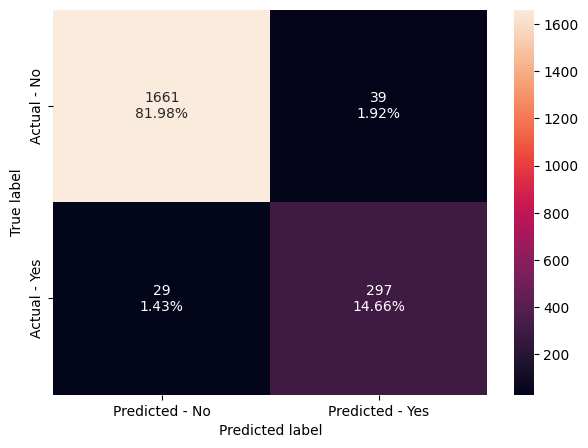

In [124]:
over_XG_val_set = display_metrics(cc_churn_train_over_models,5,val_set=True)

**Observations**
* This model is overfitting. 

#### Gradient Boost

Model Name: Gradient Boosting 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.967   0.933      0.871 0.901 



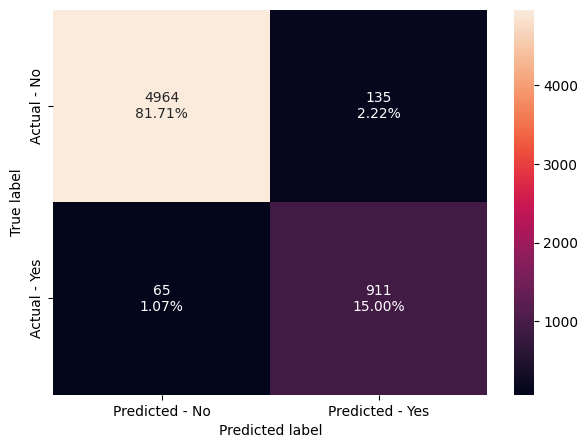

In [150]:
over_GB_train_set = display_metrics(cc_churn_train_over_models,2,train_set=True)

Model Name: Gradient Boosting 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.956   0.893      0.841 0.866


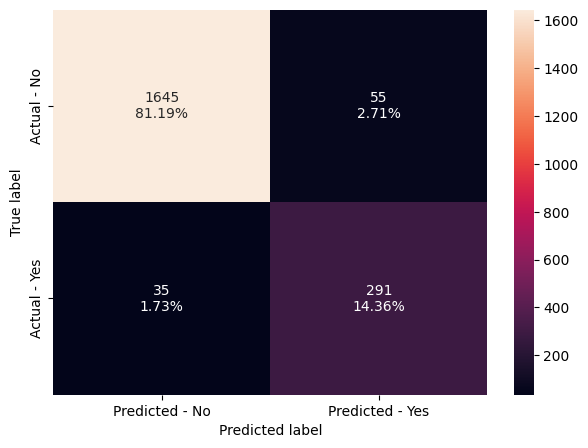

In [151]:
over_GB_val_set = display_metrics(cc_churn_train_over_models,2,val_set=True)

**Observations**
* This model is well fitted. 

#### Random Forest

Model Name: Random forest 

Training Performance:
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000 



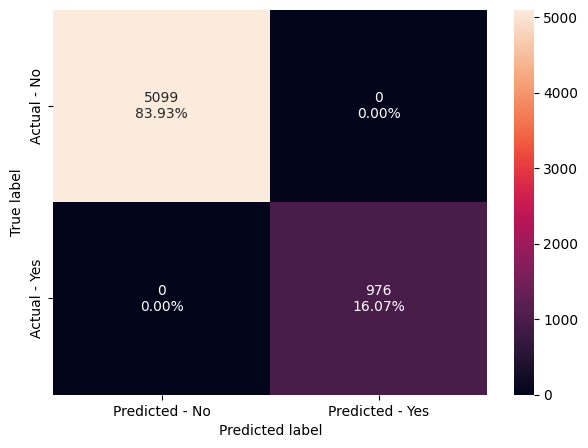

In [152]:
over_RF_train_set = display_metrics(cc_churn_train_over_models,1,train_set=True)

Model Name: Random forest 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.956   0.868      0.860 0.864


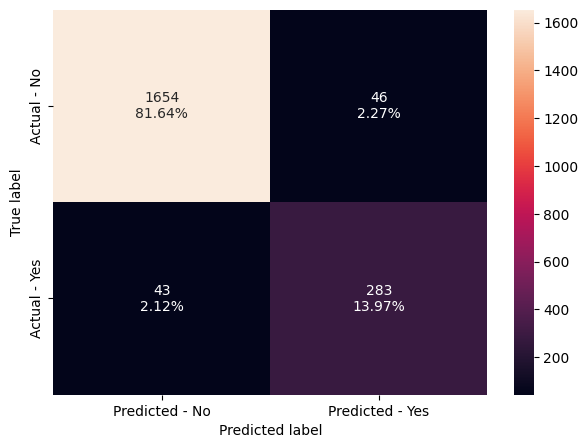

In [153]:
over_RF_val_set = display_metrics(cc_churn_train_over_models,1,val_set=True)

**Observations**
* This model is overfitting. 

## Model Building with Under sampled data

In [131]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [132]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Gradient Boosting", GradientBoostingClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9907786885245902
Random forest: 1.0
Gradient Boosting: 0.9805327868852459
AdaBoost: 0.9528688524590164
dtree: 1.0
Xgboost: 1.0

Validation Performance:

Bagging: 0.9294478527607362
Random forest: 0.9355828220858896
Gradient Boosting: 0.9570552147239264
AdaBoost: 0.9601226993865031
dtree: 0.9202453987730062
Xgboost: 0.9693251533742331


In [133]:
# Get list of models.
cc_churn_train_under_models = get_model_instance_list(X_train_un,y_train_un)
print(cc_churn_train_under_models)

[('Bagging', BaggingClassifier(random_state=1)), ('Random forest', RandomForestClassifier(random_state=1)), ('Gradient Boosting', GradientBoostingClassifier(random_state=1)), ('AdaBoost', AdaBoostClassifier(random_state=1)), ('dtree', DecisionTreeClassifier(random_state=1)), ('Xgboost', XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=Non

#### Bagging

Model Name: Bagging 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.946   0.991      0.751 0.854 



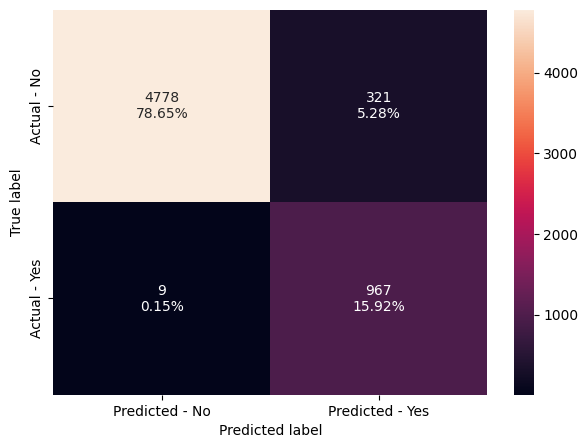

In [134]:
under_BAG_train_set = display_metrics(cc_churn_train_under_models,0,train_set=True)

Model Name: Bagging 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.923   0.929      0.695 0.795


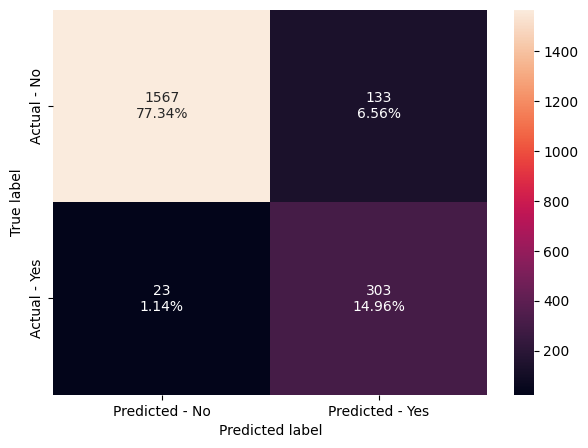

In [136]:
under_BAG_val_set = display_metrics(cc_churn_train_under_models,0,val_set=True)

**Observations**
* This model is overfitting. Has high accuracy and recall but precision and F1 score drops from training to validation sets. 

#### Decision Tree

Model Name: dtree 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.918   1.000      0.662 0.797 



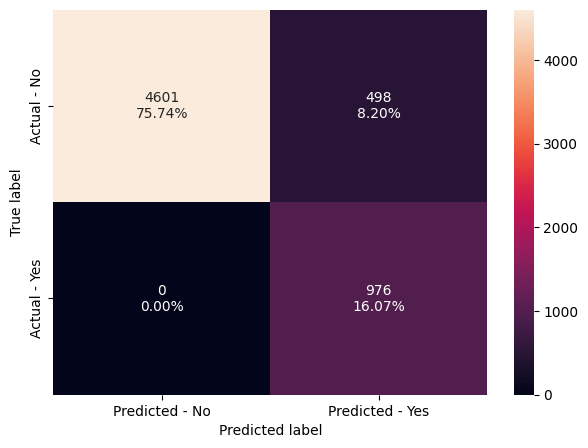

In [137]:
under_DT_train_set = display_metrics(cc_churn_train_under_models,4,train_set=True)

Model Name: dtree 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.895   0.920      0.616 0.738


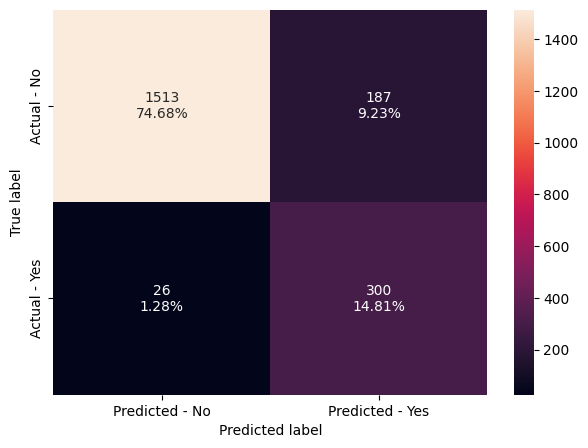

In [138]:
under_DT_val_set = display_metrics(cc_churn_train_under_models,4,val_set=True)

**Observations**
* This model is overfitting. Has high recall but accuracy, precision and F1 score drops from training to validation sets. 

#### AdaBoost

Model Name: AdaBoost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.929   0.953      0.707 0.812 



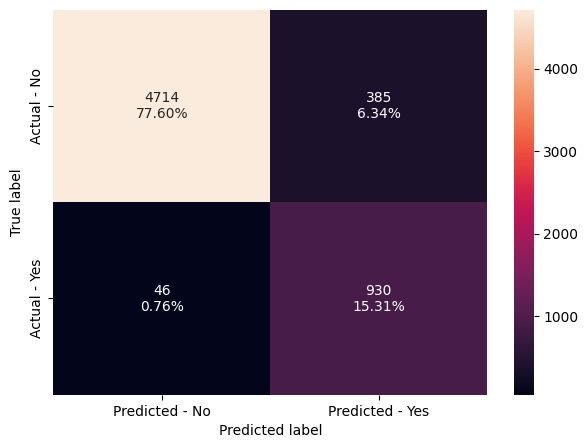

In [176]:
under_ADA_train_set = display_metrics(cc_churn_train_under_models,3,train_set=True)

Model Name: AdaBoost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.929   0.960      0.705 0.813


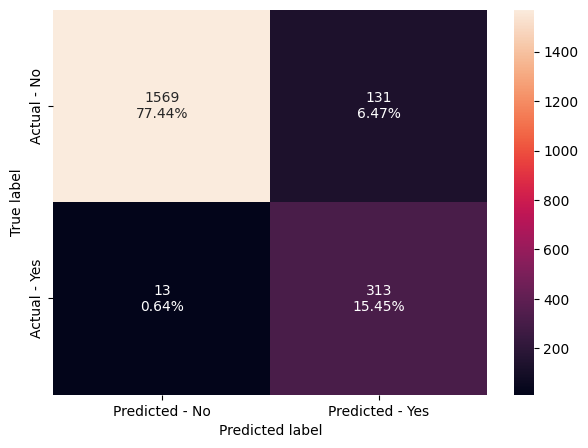

In [177]:
under_ADA_val_set = display_metrics(cc_churn_train_under_models,3,val_set=True)

**Observations**
* This model is well fitted. All scores align well. 

#### XGBoost

Model Name: Xgboost 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.959   1.000      0.798 0.888 



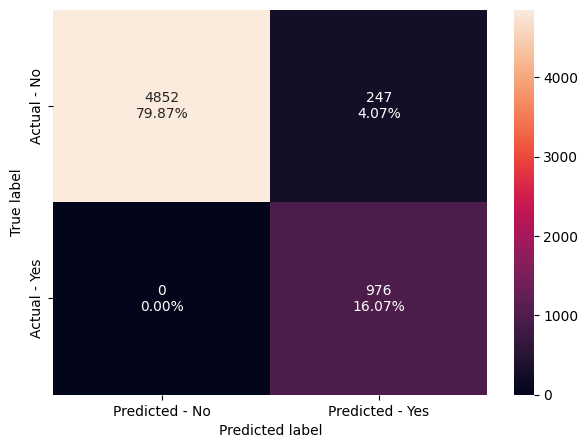

In [173]:
under_XG_train_set = display_metrics(cc_churn_train_under_models,5,train_set=True)

Model Name: Xgboost 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.944   0.969      0.752 0.847


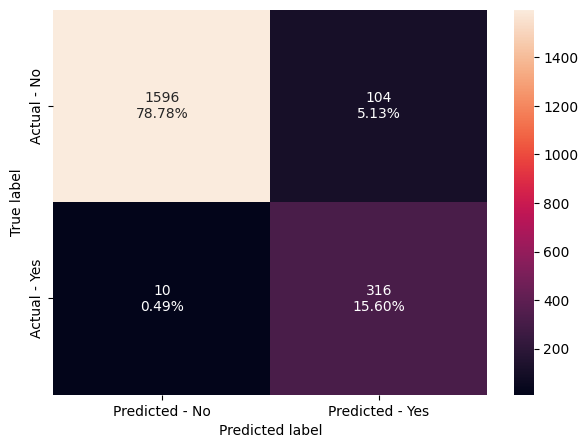

In [174]:
under_XG_val_set = display_metrics(cc_churn_train_under_models,5,val_set=True)

**Observations**
* This model is well-fitted. It has high accuracy and good recall. There is a decrease in precision and F1 score from training to validation sets.

#### Gradient Boost

Model Name: Gradient Boosting 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.943   0.981      0.746 0.847 



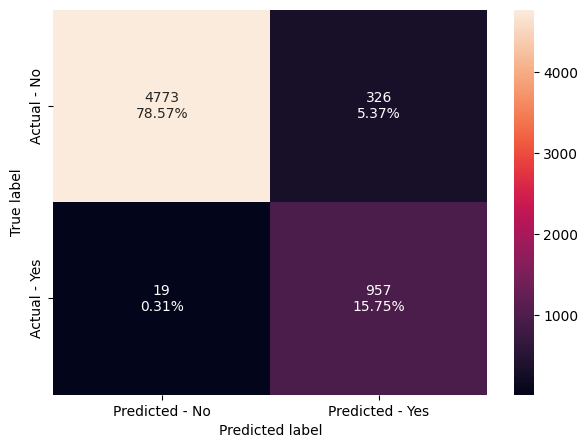

In [143]:
under_GB_train_set = display_metrics(cc_churn_train_under_models,2,train_set=True)

Model Name: Gradient Boosting 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.935   0.957      0.726 0.825


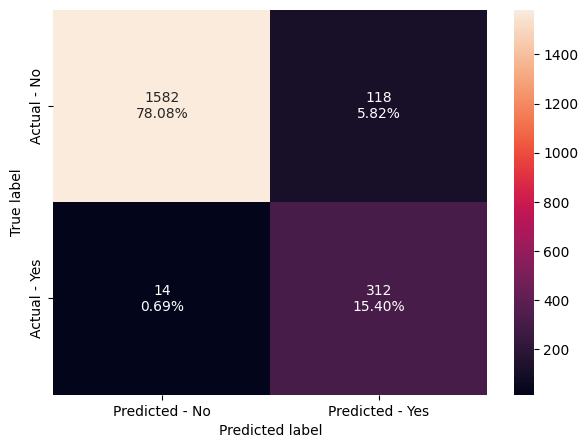

In [145]:
under_GB_val_set = display_metrics(cc_churn_train_under_models,2,val_set=True)

**Observations**
* This model is well fitted. It has high accuracy and good recall. The F1 score and precision decrease from training to validation sets.


#### Random Forest

Model Name: Random forest 

Training Performance:
   Accuracy  Recall  Precision    F1
0     0.948   1.000      0.754 0.860 



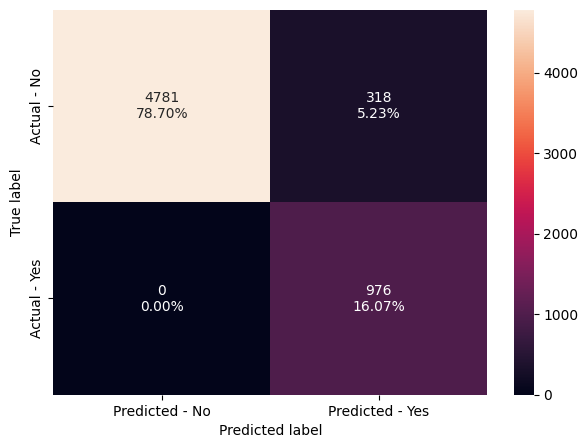

In [146]:
under_RF_train_set = display_metrics(cc_churn_train_under_models,1,train_set=True)

Model Name: Random forest 

Validation Performance:
   Accuracy  Recall  Precision    F1
0     0.933   0.936      0.728 0.819


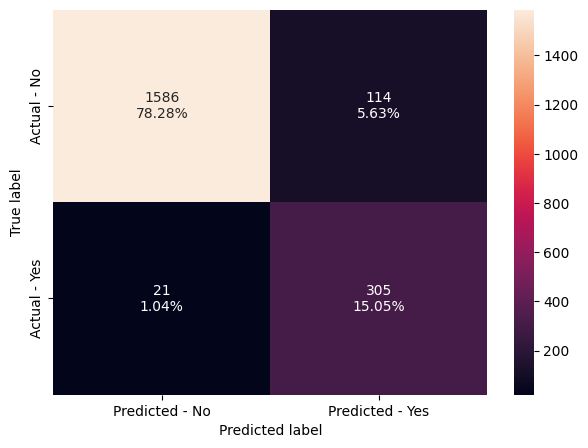

In [147]:
under_RF_val_set = display_metrics(cc_churn_train_under_models,1,val_set=True)

**Observations**
* This model is underfitting. Has high accuracy and recall. Precision and F1 score drops from training to validation sets. 

## Comparison of All Models

### Original Data

In [167]:
# Output original data training vs validation sets.
models_name = ['Bagging','Random_forest','Gradient Boost','AdaBoost','Decision Tree','XGBoost']

print("Original Data")
models_train_perf_compare = pd.concat([
perf_BAG_train_set, perf_RF_train_set, perf_GB_train_set, perf_AB_train_set, perf_DT_train_set, perf_XG_train_set],axis=0)
models_train_perf_compare.set_index([pd.Index(models_name)], inplace=True)

models_val_perf_compare = pd.concat([
perf_BAG_val_set, perf_RF_val_set, perf_GB_val_set, perf_AB_val_set, perf_DT_val_set, perf_XG_val_set],axis=0)

models_val_perf_compare.set_index([pd.Index(models_name)], inplace=True)
all_org_data_models = pd.concat([models_train_perf_compare,models_val_perf_compare],axis=1 )
all_org_data_models

Original Data


,Accuracy,Recall,Precision,F1,Accuracy,Recall,Precision,F1
Bagging,0.997,0.986,0.997,0.991,0.956,0.810,0.904,0.854
Random_forest,1.000,1.000,1.000,1.000,0.957,0.798,0.922,0.855
Gradient Boost,0.973,0.875,0.952,0.912,0.968,0.859,0.936,0.896
AdaBoost,0.957,0.827,0.900,0.862,0.962,0.853,0.906,0.878
Decision Tree,1.000,1.000,1.000,1.000,0.939,0.810,0.810,0.810
XGBoost,1.000,1.000,1.000,1.000,0.971,0.902,0.919,0.910


**Observation**
* XGBoost is overfitting on training data but shows best model performance.
* Gradient Boost and AdaBoost are the next best perfomers.

### Over Sampled Data

In [168]:
# Output over sampled data training vs validation sets.
models_name = ['Bagging','Random_forest','Gradient Boost','AdaBoost','Decision Tree','XGBoost']

print("Over Sampled Data")
models_train_over_compare = pd.concat([
over_BAG_train_set, over_RF_train_set, over_GB_train_set, over_AB_train_set, over_DT_train_set, over_XG_train_set],axis=0)

models_train_over_compare.set_index([pd.Index(models_name)], inplace=True)

models_val_over_compare = pd.concat([
over_BAG_val_set, over_RF_val_set, over_GB_val_set, over_AB_val_set, over_DT_val_set, over_XG_val_set],axis=0)

models_val_over_compare.set_index([pd.Index(models_name)], inplace=True)
all_over_data_models = pd.concat([models_train_over_compare,models_val_over_compare],axis=1 )
all_over_data_models

Over Sampled Data


,Accuracy,Recall,Precision,F1,Accuracy,Recall,Precision,F1
Bagging,0.998,0.994,0.994,0.994,0.943,0.850,0.805,0.827
Random_forest,1.000,1.000,1.000,1.000,0.956,0.868,0.860,0.864
Gradient Boost,0.967,0.933,0.871,0.901,0.956,0.893,0.841,0.866
AdaBoost,0.944,0.893,0.787,0.837,0.944,0.902,0.784,0.839
Decision Tree,1.000,1.000,1.000,1.000,0.929,0.825,0.756,0.789
XGBoost,1.000,1.000,1.000,1.000,0.966,0.911,0.884,0.897


**Observation**
* XGBoost is overfitting on training data but shows best model performance.
* Gradient Boost performs well and is not overfitting on training.

### Under Sample Data

In [175]:
# Output under sampled data training vs validation sets.
models_name = ['Bagging','Random_forest','Gradient Boost','AdaBoost','Decision Tree','XGBoost']

print("Under Sampled Data")
models_train_under_compare = pd.concat([
under_BAG_train_set, under_RF_train_set, under_GB_train_set, under_ADA_train_set, under_DT_train_set, under_XG_train_set],axis=0)
models_train_under_compare.set_index([pd.Index(models_name)], inplace=True)

models_val_under_compare = pd.concat([
under_BAG_val_set, under_RF_val_set, under_GB_val_set, under_ADA_val_set, under_DT_val_set, under_XG_val_set],axis=0)

models_val_under_compare.set_index([pd.Index(models_name)], inplace=True)
all_under_data_models = pd.concat([models_train_under_compare,models_val_under_compare],axis=1 )
all_under_data_models

Under Sampled Data


,Accuracy,Recall,Precision,F1,Accuracy,Recall,Precision,F1
Bagging,0.946,0.991,0.751,0.854,0.923,0.929,0.695,0.795
Random_forest,0.948,1.000,0.754,0.860,0.933,0.936,0.728,0.819
Gradient Boost,0.943,0.981,0.746,0.847,0.935,0.957,0.726,0.825
AdaBoost,0.929,0.953,0.707,0.812,0.929,0.960,0.705,0.813
Decision Tree,0.918,1.000,0.662,0.797,0.895,0.920,0.616,0.738
XGBoost,0.959,1.000,0.798,0.888,0.944,0.969,0.752,0.847


**Observation**
* Best performing models in order are XGBoost, AdaBoost and Gradient Boost. 

## HyperparameterTuning

The best models are AdaBoost, Gradient Boost and XGBoost on under sampled data.  

#### AdaBoost Tuning on under sampled data

In [149]:
tuned_under_data_adaboost = AdaBoostClassifier(random_state=1 )

param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=tuned_under_data_adaboost,
    param_distributions=param_grid,
    n_iter=40,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.8360596546310832:


In [196]:
# New model with tuning for AdaBoost.
model_adaboost_tuned =  AdaBoostClassifier(
    n_estimators= 100, 
    learning_rate= 0.1,
    base_estimator= DecisionTreeClassifier(max_depth=3),random_state=1)
Adaboost_tuned = model_adaboost_tuned.fit(X_train_un, y_train_un)

# Training set performance.
print("AdaBoost Model Training Set Performance\n")
ADA_train_tuned = (model_performance_classification_sklearn(Adaboost_tuned, X_train_un, y_train_un))
print(ADA_train_tuned)

# Validation set performance.
print("\nAdaBoost Model Validation Set Performance\n")
ADA_val_tuned = (model_performance_classification_sklearn(Adaboost_tuned, X_val, y_val))
print(ADA_val_tuned)

AdaBoost Model Training Set Performance

   Accuracy  Recall  Precision    F1
0     0.992   0.997      0.988 0.992

AdaBoost Model Validation Set Performance

   Accuracy  Recall  Precision    F1
0     0.938   0.966      0.734 0.834


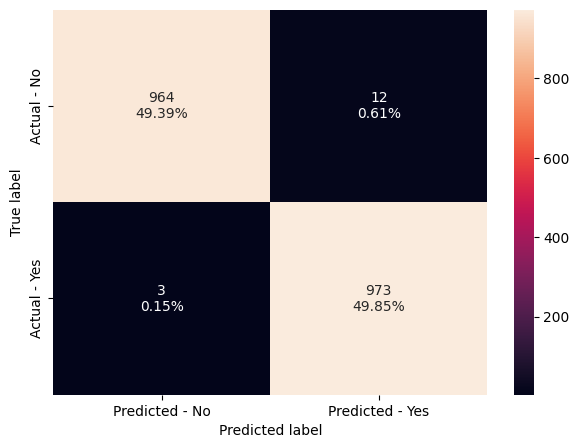

In [189]:
make_confusion_matrix(Adaboost_tuned, X_train_un, y_train_un)

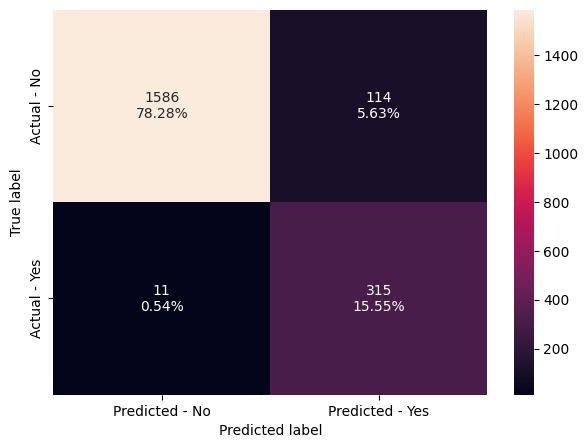

In [190]:
make_confusion_matrix(Adaboost_tuned, X_val, y_val)

### Gradient Boost Tuning on under sampled data

In [259]:
tuned_under_data_GB = GradientBoostingClassifier(random_state=1 )

param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations.
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=tuned_under_data_GB,
    param_distributions=param_grid,
    n_iter=40,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV.
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'subsample': 0.9, 'n_estimators': 75, 'max_features': 0.7, 'learning_rate': 0.1, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9508267922553637:


In [223]:
# New model with tuning for Gradient Boost.
model_GB_tuned =  GradientBoostingClassifier(
    max_features=0.7,
    init=AdaBoostClassifier(random_state=1),
    random_state=1,
    learning_rate=0.1,
    n_estimators=75,
    subsample=0.9,)
GB_tuned = model_GB_tuned.fit(X_train_un, y_train_un)

# Training set performance.
print("Gradient Boost Model Training Set Performance\n")
GB_train_tuned = (model_performance_classification_sklearn(GB_tuned, X_train_un, y_train_un))
print(GB_train_tuned)

# Validation set performance.
print("Gradient Boost Model Validation Set Performance\n")
GB_val_tuned = (model_performance_classification_sklearn(GB_tuned, X_val, y_val))
print(GB_val_tuned)

Gradient Boost Model Training Set Performance

   Accuracy  Recall  Precision    F1
0     0.970   0.977      0.964 0.970
Gradient Boost Model Validation Set Performance

   Accuracy  Recall  Precision    F1
0     0.938   0.957      0.738 0.833


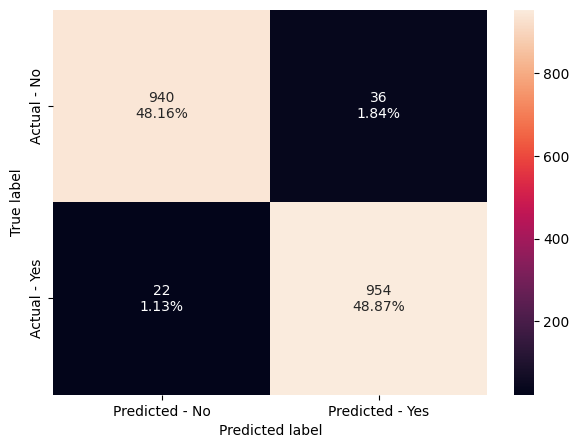

In [191]:
make_confusion_matrix(GB_tuned, X_train_un, y_train_un)

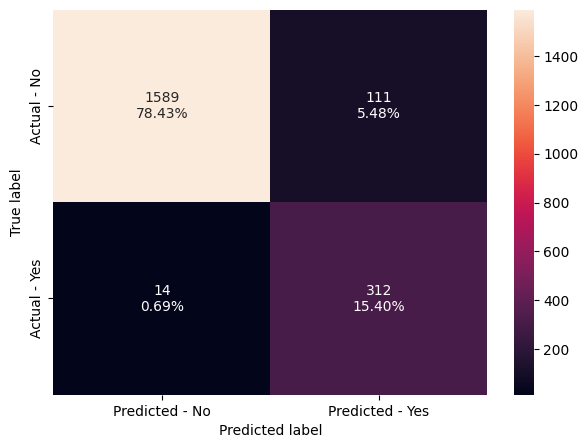

In [192]:
make_confusion_matrix(GB_tuned, X_val, y_val)

### XGBoost Tuning on under sampled data

In [186]:
tuned_under_data_XGB = XGBClassifier(random_state=1 )

param_grid={
    'n_estimators':np.arange(50,110,25),
    'scale_pos_weight':[1,2,5],
    'learning_rate':[0.01,0.1,0.05],
    'gamma':[1,3],
    'subsample':[0.7,0.9]
}

# Type of scoring used to compare parameter combinations.
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(
    estimator=tuned_under_data_XGB,
    param_distributions=param_grid,
    n_iter=40,
    scoring=scorer,
    cv=5,
    random_state=1,
)

# Fitting parameters in RandomizedSearchCV.
randomized_cv.fit(X_train_un, y_train_un)

print(
    "Best parameters are {} with CV score={}:".format(
        randomized_cv.best_params_, randomized_cv.best_score_
    )
)

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_estimators': 50, 'learning_rate': 0.01, 'gamma': 3} with CV score=0.9979591836734695:


In [221]:
# New model with tuning for XGBoost.
model_XGB_tuned = XGBClassifier(
    random_state=1,
    eval_metric="logloss",
    subsample=0.7,
    scale_pos_weight=5,
    n_estimators=50,
    learning_rate=0.01,
    gamma=3,
)
XGB_tuned = model_XGB_tuned.fit(X_train_un, y_train_un)

# Training set performance.
print("XGBoost Model Training Set Performance\n")
XGB_train_tuned = (model_performance_classification_sklearn(XGB_tuned, X_train_un, y_train_un))
print(XGB_train_tuned)

# Validation set performance.
print("XGBoost Model Validation Set Performance\n")
XGB_val_tuned = (model_performance_classification_sklearn(XGB_tuned, X_val, y_val))
print(XGB_val_tuned)

XGBoost Model Training Set Performance

   Accuracy  Recall  Precision    F1
0     0.764   1.000      0.680 0.809
XGBoost Model Validation Set Performance

   Accuracy  Recall  Precision    F1
0     0.591   1.000      0.282 0.441


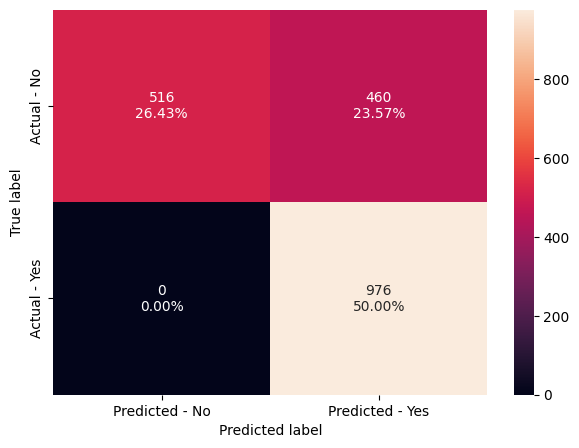

In [193]:
make_confusion_matrix(XGB_tuned, X_train_un, y_train_un)

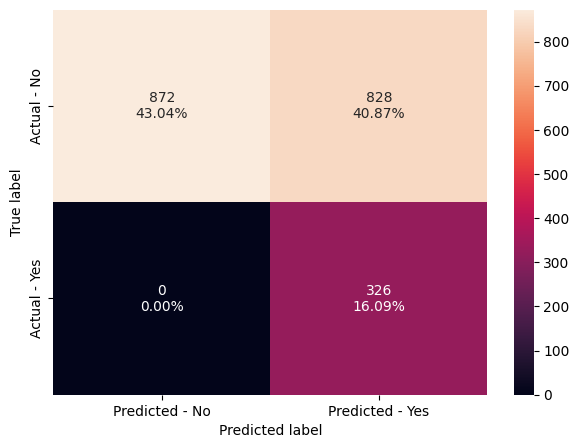

In [194]:
make_confusion_matrix(XGB_tuned, X_val, y_val)

---
---
# Model Comparison and Final Model Selection

In [227]:
# Concatenate training and validation sets.
train_model_tuned = pd.concat([ADA_train_tuned, GB_train_tuned, XGB_train_tuned], axis=0)
val_model_tuned = pd.concat([ADA_val_tuned, GB_val_tuned, XGB_val_tuned], axis=0)

# Add model type as a column.
train_model_tuned["Model"] = ["AdaBoost"] * len(ADA_train_tuned) + ["Gradient Boost"] * len(GB_train_tuned) + ["XG Boost"] * len(XGB_train_tuned)
val_model_tuned["Model"] = ["AdaBoost"] * len(ADA_val_tuned) + ["Gradient Boost"] * len(GB_val_tuned) + ["XG Boost"] * len(XGB_val_tuned)

# Print in a nice table format using pandas
print("Training Set Tuning")
print(train_model_tuned.to_string(index=False))
print("\nValidation Set Tuning")
print(val_model_tuned.to_string(index=False))

Training Set Tuning
 Accuracy  Recall  Precision    F1          Model
    0.992   0.997      0.988 0.992       AdaBoost
    0.970   0.977      0.964 0.970 Gradient Boost
    0.764   1.000      0.680 0.809       XG Boost

Validation Set Tuning
 Accuracy  Recall  Precision    F1          Model
    0.938   0.966      0.734 0.834       AdaBoost
    0.938   0.957      0.738 0.833 Gradient Boost
    0.591   1.000      0.282 0.441       XG Boost


**Observation**
* Gradient Boost is preferable with a slightly better precision score on the validation set. This indicates more balance between precision and recall based on the close to identical scores of F1 compared to AdaBoost. 

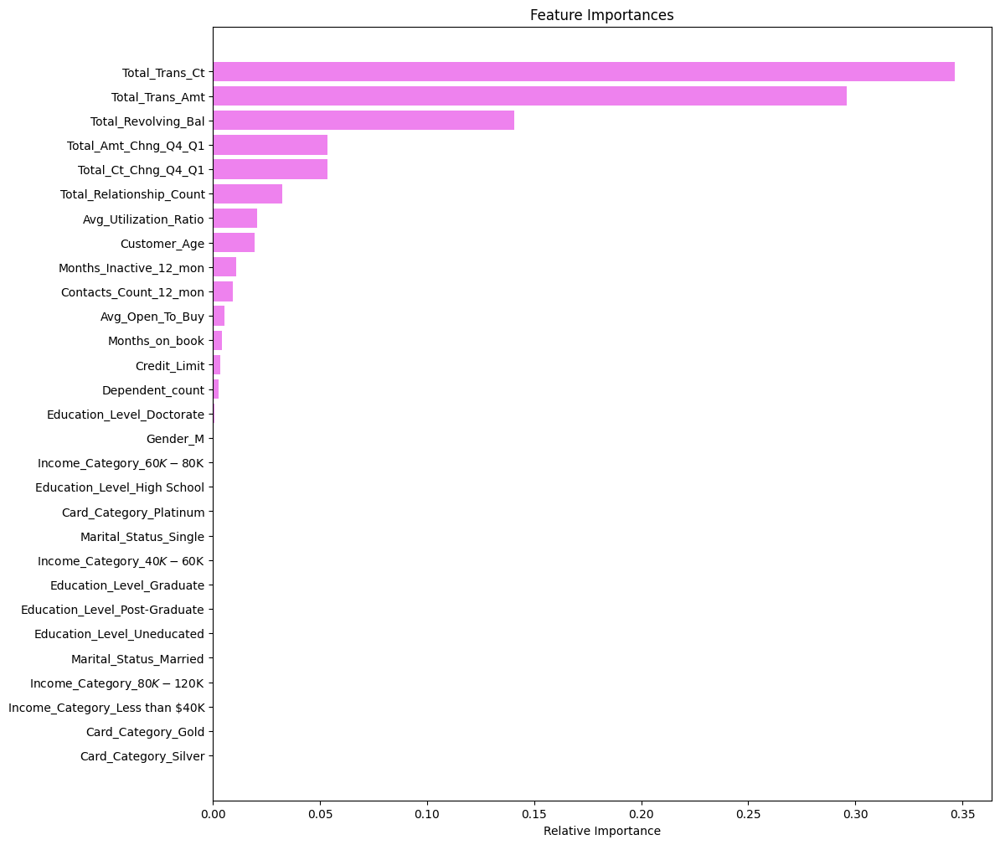

In [231]:
feature_names = X_train.columns
importances = GB_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Observations**
Top 10 important features are in the following order:
1. Total_Trans_Ct
2. Total_Trans_Amt
3. Total_Revolving_Bal
4. Total_Ct_Chng_Q4_Q1
5. Total_Amt_Chng_Q4_Q1
6. Total_Relationship_Count
7. Avg_Utilization_Ratio
8. Customer_Age
9. Months_Inactive_12_mon
10. Contacts_Count_12_mon

## Final Testing

### Train and Test Model Execution

(5063, 19) (5064, 19)

 Model Performance on final training set 

   Accuracy  Recall  Precision    F1
0     0.970   0.847      0.962 0.901

 Model Performance on final test set 

   Accuracy  Recall  Precision    F1
0     0.962   0.818      0.939 0.875


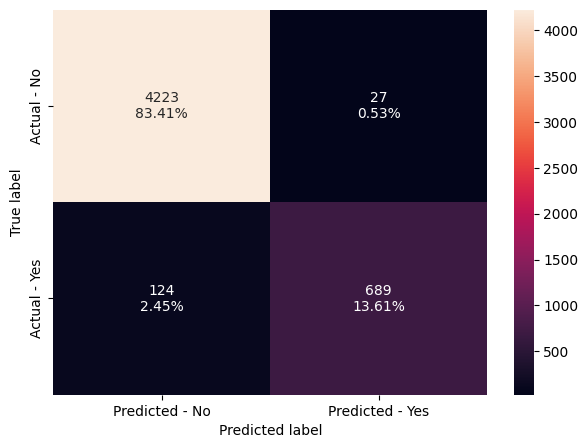

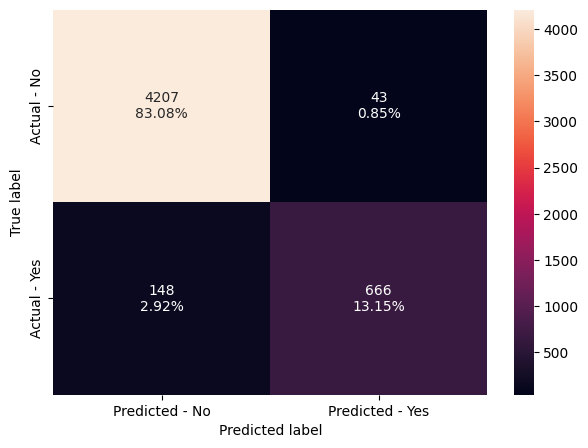

In [246]:
# Numerical features.
num_features = [
     'Customer_Age', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

# Categorical features.
cat_features = ['Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category']

# Replace missing values in numerical columns with the median value of each column.
num_transformer = Pipeline(steps=[("SimpleImputer", SimpleImputer(strategy="median"))])

# Transform categorical data.
cat_transformer = Pipeline(steps=[("SimpleImputer", SimpleImputer(strategy="most_frequent")),
        ("OneHotEncoding", OneHotEncoder(handle_unknown="ignore")),]
)

# Transform numerical and categorical columns.
transformers = ColumnTransformer(
    transformers=[
        ("numerical", num_transformer, num_features),
        ("categorical", cat_transformer, cat_features),],
    # Drop columns that were not selected to transform.
    remainder="drop",
)

# Reload dataset fresh. 
final_cc_churn_org_data = pd.read_csv("/Users/robbarker/Desktop/Credit-Card-Users-Churn-Prediction/BankChurners.csv")

# Make copy of dataset.
final_cc_churn_df = final_cc_churn_org_data.copy()

# Split target variables to X and remainder of data to Y.
X = final_cc_churn_df.drop(columns="Attrition_Flag")
Y = final_cc_churn_df["Attrition_Flag"]

# Drop CLIENTNUM as identified in data overview.
X.drop(["CLIENTNUM"], axis=1, inplace=True)

# Replace "abc" values in Income_Category data column.
X["Income_Category"].replace("abc", np.nan, inplace=True)

# Map categorical column to numerical. 
Y.replace("Existing Customer", 0, inplace=True)
Y.replace("Attrited Customer", 1, inplace=True)

# Split data into train and test.
# Validation data set is not needed for final model execution.
X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(
    X, Y, test_size=0.50, random_state=1, stratify=Y
)

# Print shape for rows/columns.
print(X_train_final.shape, X_test_final.shape)

# Creating pipeline with all defined transformers and GB best parameters from previous testing.
model = Pipeline(
    steps=[
        ("transformer", transformers),
        ("GradientBoost",
            # Values from best parameters.
            GradientBoostingClassifier(
                max_features=0.7,
                init=AdaBoostClassifier(random_state=1),
                random_state=1,
                learning_rate=0.1,
                n_estimators=75,
                subsample=0.9,),
        ),
    ]
)

# Fit the model on training data.
model.fit(X_train_final, y_train_final)

# Check performance on training set.
train_set_final =  model_performance_classification_sklearn(model, X_train_final, y_train_final)
print("\n",'Model Performance on final training set',"\n")
print(train_set_final)

# Output confusion matrices for training and testing sets.
make_confusion_matrix(model,X_train_final, y_train_final)

# Check performance on test set.
test_set_final =  model_performance_classification_sklearn(model, X_test_final, y_test_final)
print("\n",'Model Performance on final test set',"\n")
print(test_set_final)

make_confusion_matrix(model,X_test_final, y_test_final)

### Final Test Conclusion

The Gradient Boost model was chosen as the best model from training and validation testing. This model indicates a strong model with good generalization. Here is a breakdown of results.

**Training Set Performance**
* Accuracy (0.970): Model correctly predicts 97% of training data set outcomes. This accuracy shows the model fits training data set.
* Recall (0.847): The model correctly identifies 84.7% of actual positive cases. The recall value indicates the model is fairly good at predicting positives but does miss some positive cases.
* Precision (0.962): 96.2% of the time the model predicts positive countcomes. This shows a low false positive rate.
* F1 Score (0.901): At 90.1% the balance between precision and recall is high indicating a training data set balance.

**Test Set Performance**
* Accuracy (0.962): Model correctly predicts 96.2% of testing set outcomes. This is 0.8% lower than the training set but still high.
* Recall (0.818): 81.8% of the time actual positives are identified in the test data set. This is lower than training data set recall which could indicate the model will not capture all positive cases.
* Precision (0.939): Precision is lower (2.3%) in the test data set vs training data set. At 93.9% this is a low rate of false positives.
* F1 Score (0.875): There is a good balance between precision and recall but it slightly lower than the training data set by 2.6%.

**Summary**
* The model demonstrates high accuracy, precision, and F1 scores on both the training and test sets.
* The decrease in recall and precision from training data set to test data set is minimal and shows the model is not overfitting.
* There is room for improvement to increase recall with more hyperparameter tuning. 

---
---
# Business Insights and Conclusions

## Business Insights
* 16.1% of customers are attrited.
* Females make up 53% of the customer base.
* Graduate education level makes up 31% of customers.
* Married customers make up 46% and those that are single represent 39%.
* Customer earning less than $40,000 represent 35%.
* 93% of customers have the Blue Card.
* The Platinum Card represents a very small customer base of 0.2%.
* Total Transaction Amount and Total Transaction Counts are strongly correlated (0.81). This leads to customer attrition.
* Months on Book and Customer Age have a strong positive correction.
* Total Revolving Balance and Average Utilization Ratio are positively correlated.
* Average Utilization Ratio and Credit Limit are negatively correlated.  
* Low Total Transaction Count can lead to customer attrition.
* The top three features that impact customer attrition are Total Transaction Count, Amount and Revolving Balance.



## Recommendations
* Customer retention should be a top priority and reviewed as frequently as possible. Once a ML model has been created daily/weekly reports should be automated to internal stakeholders for review and developing an action plan.
* Customer interactions with Thera Bank should be improved to collect feedback or concerns from customers to understand factors affecting attrition. With the low number of interactions the bank should consider deploying different interaction models, ChatBot, web site feedback forms, email or mobile banking applications.
* Thera Bank should collect click stream behavior to identify what customers are viewing to customize an offering to them. This offer could be directed to customers through mobile application, web site or email. 
* The type of credit card (Blue, Gold, Silver, Platinum) should be investigated to determine if special interest rates could be offered or balance transfer programs.
* Review different banking products to determine if special packaging could be implemented to retain customers.
* Collecting income information on a quarterly basis could be implemented to understand changes in income to then offer card upgrades, interest rates or home loans.

***